# Capstone Project - The Battle of the Neighborhoods (Week 2)
### Applied Data Science Capstone by IBM/Coursera

# <center> City Comparison - Toronto vs New York<a id="1"></a>

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
<br>&ensp;[Load Neighborhood / Borough Data from each City](#2)
* [Methodology](#methodology)
<br>&ensp;[Default(Releveance) vs SortByPopularity(Popularity)](#3)
<br>&ensp;[Exploring venues from each Neighborhood](#4)
<br>&ensp;[Venues Density Calculation](#9)
<br>&ensp;[Analysis Category Diversity](#5)
<br>&ensp;[Analyzing by Neighborhoods - Clustering](#6)
<br>&ensp;[Detailed Venues Analysis (Rating, Likes, Tips, Photos)](#7)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)




## Introduction: Business Problem <a id="introduction"></a>

**Background**:
<p style='text-align: justify;'> - New York City (NYC), often called simply New York, is the most populous city in the United States. With an estimated 2019 population of 8,336,817 distributed over about 302.6 square miles (784 km2), New York City is also the most densely populated major city in the United States. New York City has been described as the cultural, financial, and media capital of the world, significantly influencing commerce, entertainment, research, technology, education, politics, tourism, art, fashion, and sports.

<p style='text-align: justify;'> - Toronto is the capital city of the Canadian province of Ontario. With a recorded population of 2,731,571 in 2016 distributed over about 243.3 square miles ( 630.2 km2) it is the most populous city in Canada and the fourth most populous city in North America. Toronto is an international centre of business, finance, arts, and culture, and is recognized as one of the most multicultural and cosmopolitan cities in the world.  

**Problem:**

<p style='text-align: justify;'> - Both cities are the main cities from each country and also the most populous cities in North America. So since they are important cities for each country, we want to find the differences between them comparing the neighborhoods and analyzing based on the venues of each cities. 


**Interest:**

<p style='text-align: justify;'> - The stakeholders will be international brands, who want to expand to North America, so that with the analysis, differences and characteristics that each city contributes presented in this project to choose the best option based on their requirements, brand category, etc. 




## Data <a id="data"></a>

<p style='text-align: justify;'>
- Based on the description of our problem, first of all, we will need the Neighborhood/Borough data from each City and for that  we gonna use a JSON file used in one of the course laboratories of New York City, which it contains Neighborhood/Borough with their respetive geospatial coordinates and in the case of Toronto City of Toronto, we gonna use web scrapping to get the Neighborhood/Borough with their postal codes additionally with a dataset that contains the geospatial coordinates of each postal code and finally join these two parts to obtain the desired dataframe.
<p style='text-align: justify;'>
- Secondly, we gonna use the Foursquare API to explore the venues from each Neighborhood of each Borough from each City, which will give us the following information from each venue: name, category, geospatial coordinates(Latitude, Longitude), city and venue ID, which It gonna help us to have the first analysis. Then, we will get detaliled information from some selected venues which will give us relevent information: verified status, rating, likes, tips and photos count with which we will finish our analysis. Finally, this will help us evaluate both cities and see the similarities / differences.




In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files
import requests

#!conda install -c conda-forge geopy --yes 

from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
import urllib.request, json 

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes 
import folium # map rendering library

#Ignore warnings
import warnings
warnings.filterwarnings("ignore")

#web scrapping
import lxml.html as lh
print('Libraries imported.')

Libraries imported.


#### Folium API Credentials

In [2]:
 #Foursquare Credentials and Version

### Neighborhood / Borough Data from each City<a id="2"></a>

As we mentioned before, in this section we will build the Dataframes that cointains Boroughs, Neighborhoods and their respective  geospatial coordinates, so we can be able to analyze each Neighborhoods later.

#### Toronto City


For this case, we gonna scrappe the information from Wikipedia, where we can find a table showing the Postal Codes of each Neighborhood / Borough. For which later we will use a database where the coordinates of each zip code are and with this, later we can merge both information and obtain the DataFrame that we are looking for.

In [3]:
#Scrapping data from Web
url='https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M'
#Create a handle, page, to handle the contents of the website
page = requests.get(url)
#Store the contents of the website under doc
doc = lh.fromstring(page.content)
#Parse data that are stored between <tr>..</tr> of HTML
tr_elements = doc.xpath('//tr')

#Looking for the tables on the web
URL = 'https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M'
tables = pd.read_html(URL)
print("There are : ",len(tables)," tables")
print("Take look at table 0")
print(tables[0])

There are :  3  tables
Take look at table 0
    Postal Code           Borough  \
0           M1A      Not assigned   
1           M2A      Not assigned   
2           M3A        North York   
3           M4A        North York   
4           M5A  Downtown Toronto   
5           M6A        North York   
6           M7A  Downtown Toronto   
7           M8A      Not assigned   
8           M9A         Etobicoke   
9           M1B       Scarborough   
10          M2B      Not assigned   
11          M3B        North York   
12          M4B         East York   
13          M5B  Downtown Toronto   
14          M6B        North York   
15          M7B      Not assigned   
16          M8B      Not assigned   
17          M9B         Etobicoke   
18          M1C       Scarborough   
19          M2C      Not assigned   
20          M3C        North York   
21          M4C         East York   
22          M5C  Downtown Toronto   
23          M6C              York   
24          M7C      Not assign

Let's find the table and then save it into a dataframe

In [4]:
#We found the table and we save it 
toronto = tables[0]
toronto.head()

,Postal Code,Borough,Neighbourhood
0,M1A,Not assigned,Not assigned
1,M2A,Not assigned,Not assigned
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,"Regent Park, Harbourfront"


We remove the rows where a Borough is not assigned.

In [5]:
#Cleanning the DataFrame 
toronto.drop(toronto[toronto['Borough']=='Not assigned'].index, inplace = True )


We read and save the geospatial dataset to merge it with the above dataframe

In [6]:
#Proceed to read the CSV with the coordinates of each Postal Code 
mainpath = "/Users/Hugo/Downloads/"
filename = "Geospatial_Coordinates.csv"
data_coord = pd.read_csv(mainpath + "/" + filename,sep=",",header = 0)
data_coord.head()

,Postal Code,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476


In [7]:
#We merge the two dataframes to get the final result, with the coordinates
toronto_cluster = pd.merge(toronto, data_coord, on='Postal Code')
toronto_cluster.columns = ['Postal Code', 'Borough', 'Neighborhood', 'Latitude', 'Longitude']
print("Dimensions:{}".format(toronto_cluster.shape))
toronto_cluster.head()

Dimensions:(103, 5)


,Postal Code,Borough,Neighborhood,Latitude,Longitude
0,M3A,North York,Parkwoods,43.753259,-79.329656
1,M4A,North York,Victoria Village,43.725882,-79.315572
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636
3,M6A,North York,"Lawrence Manor, Lawrence Heights",43.718518,-79.464763
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494


Now that we have the dataframe done, we procced to check the amount of boroughs and neighborhoods.

In [8]:
#Check the amounts of Boroughs and Neighborhoods
print('The dataframe has {} boroughs and {} neighborhoods.'.format(len(toronto_cluster['Borough'].unique()),toronto_cluster.shape[0]))

The dataframe has 10 boroughs and 103 neighborhoods.


In [9]:
#We check the Boroughs of the city
toronto_cluster['Borough'].unique().tolist()

['North York',
 'Downtown Toronto',
 'Etobicoke',
 'Scarborough',
 'East York',
 'York',
 'East Toronto',
 'West Toronto',
 'Central Toronto',
 'Mississauga']

Finally, we plot all the points we have in our final Dataframe, which represent each Neighborhood in the city of Toronto.

In [10]:
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

# Get the coordinates of Toronto with geopy lib
geolocator = Nominatim(user_agent="Cities_explorer") #Nombre de la aplicacion
location = geolocator.geocode("Toronto")
latitude_toronto = location.latitude
longitude_toronto = location.longitude
# create map
toronto_borough = folium.Map(location=[latitude_toronto, longitude_toronto], zoom_start=11)

# loop through the 100 crimes and add each to the incidents feature group
for lat, lng, cat, name in zip(toronto_cluster.Latitude, toronto_cluster.Longitude, toronto_cluster['Neighborhood'], toronto_cluster['Borough']):
    label = '{}, {}'.format(cat, name)
    label = folium.Popup(label, parse_html=True)
    folium.features.CircleMarker(
        [lat, lng],
        radius=5, # define how big you want the circle markers to be
        color='purple',
        fill=True,
        popup = label,
        fill_color ='red',
        fill_opacity=0.8,
        parse_html=False
    ).add_to(toronto_borough)
    
#show map
toronto_borough

### New York City

For this city we will use the JSON file that contains the Neighborhoods / Boroughs information with their respective geospatial coordinates, where we will pass all this information to a DataFrame.

In [11]:
#We load the JSON File with the coordinates of Boroughs & Neighborhoods of NY
with urllib.request.urlopen("https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DS0701EN-SkillsNetwork/labs/newyork_data.json") as url:
    ny_data = json.loads(url.read().decode())
    print(ny_data)

{'type': 'FeatureCollection', 'totalFeatures': 306, 'features': [{'type': 'Feature', 'id': 'nyu_2451_34572.1', 'geometry': {'type': 'Point', 'coordinates': [-73.84720052054902, 40.89470517661]}, 'geometry_name': 'geom', 'properties': {'name': 'Wakefield', 'stacked': 1, 'annoline1': 'Wakefield', 'annoline2': None, 'annoline3': None, 'annoangle': 0.0, 'borough': 'Bronx', 'bbox': [-73.84720052054902, 40.89470517661, -73.84720052054902, 40.89470517661]}}, {'type': 'Feature', 'id': 'nyu_2451_34572.2', 'geometry': {'type': 'Point', 'coordinates': [-73.82993910812398, 40.87429419303012]}, 'geometry_name': 'geom', 'properties': {'name': 'Co-op City', 'stacked': 2, 'annoline1': 'Co-op', 'annoline2': 'City', 'annoline3': None, 'annoangle': 0.0, 'borough': 'Bronx', 'bbox': [-73.82993910812398, 40.87429419303012, -73.82993910812398, 40.87429419303012]}}, {'type': 'Feature', 'id': 'nyu_2451_34572.3', 'geometry': {'type': 'Point', 'coordinates': [-73.82780644716412, 40.887555677350775]}, 'geometry_n

We select the relevant data which is a list of neighborhoods

In [12]:
neighborhoods_data = ny_data['features']

Then we will transform all the data from the JSON file into a Dataframe

In [13]:
#Transform the data into a Dataframe

# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
newyork_cluster = pd.DataFrame(columns=column_names)

#fill the clean dataframe with the data

for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    newyork_cluster = newyork_cluster.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

print("Dimensions:{}".format(newyork_cluster.shape))
newyork_cluster.head()

Dimensions:(306, 4)


,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


Since there are neighborhoods with the same name that belongs to different boroughs, we gonna add another character to the Neighborhood's name to differentiate them and avoid any problem later.

In [14]:
#We delete the duplicate rows
newyork_clusterfix = newyork_cluster.drop_duplicates(subset =['Neighborhood'], keep = False)

#We select the duplicate rows and rename them
fix = newyork_cluster[newyork_cluster.duplicated(['Neighborhood'],keep=False)]
fix = fix.reset_index(drop=True)
for i in np.arange(fix.shape[0]): 
    fix['Neighborhood'][i] = fix['Neighborhood'][i] + ', ' + fix['Borough'][i]

#finally, join both parts to have the final DF    
newyork_cluster = newyork_clusterfix.append(fix)
newyork_cluster = newyork_cluster.reset_index(drop=True)
newyork_cluster
                     

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585
5,Bronx,Kingsbridge,40.881687,-73.902818
6,Manhattan,Marble Hill,40.876551,-73.910660
7,Bronx,Woodlawn,40.898273,-73.867315
8,Bronx,Norwood,40.877224,-73.879391
9,Bronx,Williamsbridge,40.881039,-73.857446


Now that we have the dataframe done, we procced to check the amount of boroughs and neighborhoods

In [15]:
#Check the amounts of Boroughs and Neighborhoods
print('The dataframe has {} boroughs and {} neighborhoods.'.format(len(newyork_cluster['Borough'].unique()),newyork_cluster.shape[0]))

The dataframe has 5 boroughs and 306 neighborhoods.


In [16]:
#We check the Boroughs of the city
newyork_cluster['Borough'].unique()

array(['Bronx', 'Manhattan', 'Brooklyn', 'Queens', 'Staten Island'],
      dtype=object)

Finally, we plot all the points we have in our final Dataframe, which represent each Neighborhood in the city of Toronto. And as we can see there's almost **x3 times more neighborhoods** and therefore **more density** on **New York City** than in Toronto, that's a detail that we need to take in consideration for later. 

In [17]:
# Get the coordinates of NY with geopy lib
location = geolocator.geocode("New York")
latitude_ny = location.latitude
longitude_ny = location.longitude

# create map
ny_borough = folium.Map(location=[latitude_ny, longitude_ny], zoom_start=11)

# loop through the 100 crimes and add each to the incidents feature group
for lat, lng, cat, name in zip(newyork_cluster.Latitude, newyork_cluster.Longitude, newyork_cluster['Neighborhood'], newyork_cluster['Borough']):
    label = '{}, {}'.format(cat, name)
    label = folium.Popup(label, parse_html=True)
    folium.features.CircleMarker(
        [lat, lng],
        radius=5, # define how big you want the circle markers to be
        color='purple',
        fill=True,
        popup = label,
        fill_color ='red',
        fill_opacity=0.8,
        parse_html=False
    ).add_to(ny_borough)
    
#show map
ny_borough



### Exploring venues from each Neighborhood <a id="4"></a>

In this section, having already made the previous comparison, using the default parameters with the respective function, we will search for the venues using the initial Neighborhood / Borough Dataframes of each City, with the help of the Foursquare API and the geographic coordinates belonging to their respective Neighborhood. With the results obtained, we will build a DataFrame with the venues found and some relevant data, such as their category, location, geographic coordinates and ID.

In addition, we will modify GetNearbyVenues to extract the number of places found for each request with the Foursquare API within the search radius, which will help us to be able to calculate the number of places per square kilometer and build a data frame and with this be able to have a measure of agglomeration of venues by Neighborhood / Borough of each city.

In [18]:
#Function that will find venues from each Neighborhood and another dataframe with the total 
#results of each request with with the calculation of the Venues por area 

def getNearbyVenues(names, latitudes, longitudes,borough, limit, radius=500):
    
    venues_list=[]
    venues_qty=[]
    area = 2*((radius/1000)**2)*3.1416
    for name, lat, lng, bor in zip(names, latitudes, longitudes,borough):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            limit)
            
        # make the GET request
        req = requests.get(url).json()
        
        results = req["response"]['groups'][0]['items']
        # return only relevant information for each nearby venue
            
              
        for v in results:
            try:
                venues_qty.append([(name, lat,lng,bor,req['response']['totalResults'],
                                    round(req['response']['totalResults']/area,2))])
                venues_list.append([(
                    name, 
                    lat, 
                    lng, 
                    v['venue']['name'], 
                    v['venue']['location']['lat'], 
                    v['venue']['location']['lng'],
                    v['venue']['categories'][0]['name'],
                    v['venue']['location']['city'],
                    v['venue']['id']
                    )])
            except:
                venues_list.append([(
                    name, 
                    lat, 
                    lng, 
                    v['venue']['name'], 
                    v['venue']['location']['lat'], 
                    v['venue']['location']['lng'],
                    v['venue']['categories'][0]['name'],
                    'Error',
                    v['venue']['id']
                    )])
                continue
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude','Venue Category','City',
                  'Venue ID']
    venues_area = pd.DataFrame([item for venues_qty in venues_qty for item in venues_qty])
    venues_area.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude','Borough', 
                  'Total Results','Venues/Km²']
    
    return(nearby_venues,venues_area)

#### Toronto City - Venues Exploration

We have to take into account that in New York City there is a greater number of Neigborhoods,as we saw from the maps of the cities there is a higher density of neighborhoods, so it will be necessary to increase the limit of venues per search and in addition to increasing the search radius to obtain a similar number of venues in the resulting dataframes. So, for the **city of Toronto** we are going to establish a **venues limit of 500** and a **radius of 3000 meters.**

In [19]:
#Start the exploration of venues and getting the venues/area calculations for Toronto City
toronto_venues, toronto_area = getNearbyVenues(names=toronto_cluster['Neighborhood'],
                                   latitudes=toronto_cluster['Latitude'],
                                   longitudes=toronto_cluster['Longitude'],borough = toronto_cluster['Borough'],limit = 500,
                                  radius = 3000) 

Parkwoods
Victoria Village
Regent Park, Harbourfront
Lawrence Manor, Lawrence Heights
Queen's Park, Ontario Provincial Government
Islington Avenue, Humber Valley Village
Malvern, Rouge
Don Mills
Parkview Hill, Woodbine Gardens
Garden District, Ryerson
Glencairn
West Deane Park, Princess Gardens, Martin Grove, Islington, Cloverdale
Rouge Hill, Port Union, Highland Creek
Don Mills
Woodbine Heights
St. James Town
Humewood-Cedarvale
Eringate, Bloordale Gardens, Old Burnhamthorpe, Markland Wood
Guildwood, Morningside, West Hill
The Beaches
Berczy Park
Caledonia-Fairbanks
Woburn
Leaside
Central Bay Street
Christie
Cedarbrae
Hillcrest Village
Bathurst Manor, Wilson Heights, Downsview North
Thorncliffe Park
Richmond, Adelaide, King
Dufferin, Dovercourt Village
Scarborough Village
Fairview, Henry Farm, Oriole
Northwood Park, York University
East Toronto, Broadview North (Old East York)
Harbourfront East, Union Station, Toronto Islands
Little Portugal, Trinity
Kennedy Park, Ionview, East Birchmo

In [20]:
#We eliminate duplicate venues taking into account the latitudes, longitudes and name of the venue 
#to avoid eliminating stores that belong to the same brand.
toronto_venues1 =toronto_venues.drop_duplicates(subset =["Venue",'Venue Latitude', 'Venue Longitude'],
                     keep = "first")
print(toronto_venues1.shape)
toronto_venues1.head()

(3372, 9)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,City,Venue ID
0,Parkwoods,43.753259,-79.329656,Allwyn's Bakery,43.759840,-79.324719,Caribbean Restaurant,Toronto,4b8991cbf964a520814232e3
1,Parkwoods,43.753259,-79.329656,Donalda Golf & Country Club,43.752816,-79.342741,Golf Course,Don Mills,4bd4846a6798ef3bd0c5618d
2,Parkwoods,43.753259,-79.329656,Tim Hortons,43.760668,-79.326368,Café,Toronto,57e286f2498e43d84d92d34a
3,Parkwoods,43.753259,-79.329656,Galleria Supermarket,43.753520,-79.349518,Supermarket,Toronto,4ccec87654f0b1f7f32824ca
4,Parkwoods,43.753259,-79.329656,Graydon Hall Manor,43.763923,-79.342961,Event Space,Toronto,4b8ec91af964a520053733e3


In [21]:
#Check some stadistical info about the category
toronto_venues1['Venue Category'].describe()

count            3372
unique            297
top       Coffee Shop
freq              274
Name: Venue Category, dtype: object

#### New York - Venues Exploration

Following the above reasoning, for **New York City** we will choose a **venue limit of 20** and a **radius of 500 meters**.

In [23]:
newyork_venues, newyork_area = getNearbyVenues(names=newyork_cluster['Neighborhood'],
                                   latitudes=newyork_cluster['Latitude'],
                                   longitudes=newyork_cluster['Longitude'],borough = newyork_cluster['Borough'],limit = 20, radius=500)

Wakefield
Co-op City
Eastchester
Fieldston
Riverdale
Kingsbridge
Marble Hill
Woodlawn
Norwood
Williamsbridge
Baychester
Pelham Parkway
City Island
Bedford Park
University Heights
Morris Heights
Fordham
East Tremont
West Farms
High  Bridge
Melrose
Mott Haven
Port Morris
Longwood
Hunts Point
Morrisania
Soundview
Clason Point
Throgs Neck
Country Club
Parkchester
Westchester Square
Van Nest
Morris Park
Belmont
Spuyten Duyvil
North Riverdale
Pelham Bay
Schuylerville
Edgewater Park
Castle Hill
Olinville
Pelham Gardens
Concourse
Unionport
Edenwald
Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
East Flatbush
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Cobble Hill
Carroll Gardens
Red Hook
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Starrett City
Canarsie
Flatlands
Mill Island
Manhattan Beach
Coney Island
Bath Beach
Borough Park
Dyker

In [24]:
#We eliminate duplicate venues taking into account the latitudes, longitudes and name of the venue 
#to avoid eliminating stores that belong to the same brand.
newyork_venues1 =newyork_venues.drop_duplicates(subset =["Venue",'Venue Latitude', 'Venue Longitude'], 
                     keep = "first")
print(newyork_venues1.shape)
newyork_venues1.head()

(4688, 9)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,City,Venue ID
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop,Bronx,4c537892fd2ea593cb077a28
1,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop,Bronx,4c783cef3badb1f7e4244b54
2,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy,Bronx,5d5f5044d0ae1c0008f043c3
3,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy,Bronx,4d6af9426107f04dedeb297a
4,Wakefield,40.894705,-73.847201,Dunkin',40.890459,-73.849089,Donut Shop,Bronx,4c25c212f1272d7f836385c5


<p style='text-align: justify;'>At this point, we already have build the two Dataframes of each City with the venues obtained from exploring each Neighborhood. Now, we will build new Dataframes in which we will obtain detailed information for each venue belonging to the previous dataframes using , but since the venues dataframes has more than 1000+ venues each one, we will have to select a total quantity less than 500 not to exceed the limit of 500 premium calls and for that we'll create a function "ClosestVenuesBorough" to select "n" venues closest to the center of each Borough respectively. 

In [25]:
#We add the columns Borough and Neighborhood from the initial dataframe to the venues Dataframe, 
#for later selection of the closest venues based on the distance from their respective borough

toronto_venues2 = toronto_venues1.join(toronto_cluster[['Borough','Neighborhood']].set_index('Neighborhood'),on='Neighborhood')
newyork_venues2 = newyork_venues1.join(newyork_cluster[['Borough','Neighborhood']].set_index('Neighborhood'),on='Neighborhood')

In [26]:
#Function to select a quantity n of closest venues with the data of the Dataframe, carrying out the calculation 
#of distances (meters) with the geospatial coordinates of each venue and the center of the borough to which they belong

from geopy.distance import geodesic
def ClosestVenuesBorough(dataframe,numofvenues = 10):
    
        
    boroughnames = dataframe['Borough'].unique().tolist()
    boroughqty = len(boroughnames)
    df_final = pd.DataFrame()
    #distlist = pd.DataFrame(columns = ['Distance', 'Venue ID'])
    for i in range(boroughqty):
        distlist = pd.DataFrame(columns = ['Distance', 'Venue ID'])
        geolocator = Nominatim(user_agent="newexplorer") #Nombre de la aplicacion
        location = geolocator.geocode(boroughnames[i])
        latitude = location.latitude
        longitude = location.longitude
        boroughcoord = (latitude,longitude)
        df = dataframe[dataframe['Borough']==boroughnames[i]]
        df = df.reset_index(drop= True)
        counter_calc = 0
        
        for j in range(0,df.shape[0]):
        
            venuecoord = [df['Venue Latitude'][j],df['Venue Longitude'][j]]
            dist = geodesic(boroughcoord,venuecoord)
            distlist = distlist.append({'Distance': dist,'Venue ID':df['Venue ID'][j]},ignore_index=True)
            counter_calc += 1
            
        #Ahora buscamos la cantidad de venues deseadas
        print('{} Calculations of Distances of Venues/Borough Finished.'.format(counter_calc))
        #Tengo que armar un dataframe con los datos
        distlist = distlist.sort_values('Distance',ascending=True)
        distlist = distlist.reset_index(drop= True)
        distfinal = distlist.iloc[0:numofvenues,:] #Confirmar el -1 / Creo que si works
        df_merge = distfinal.join(dataframe.set_index('Venue ID'), on = 'Venue ID')
        #Creo que faltaria arreglar la posicion de las columnas
        df_final =df_final.append(df_merge)
        df_final = df_final.reset_index(drop= True)
        print('Number of rows in total accumulated: ', df_final.shape[0])
        print('Borough {} Finished.'.format(boroughnames[i]))
        
    print('Successful process finished.')
    return df_final
        

We start selecting the most closest venues from the center of their borough.Since there are 10 borough on Toronto City, We will select 20 per borough to reach 200 venues in order not to exceed the limit of Premium calls.

In [27]:
toronto_venue_rating = ClosestVenuesBorough(toronto_venues2,numofvenues = 20)

1369 Calculations of Distances of Venues/Borough Finished.
Number of rows in total accumulated:  20
Borough North York Finished.
302 Calculations of Distances of Venues/Borough Finished.
Number of rows in total accumulated:  40
Borough Downtown Toronto Finished.
572 Calculations of Distances of Venues/Borough Finished.
Number of rows in total accumulated:  60
Borough Etobicoke Finished.
636 Calculations of Distances of Venues/Borough Finished.
Number of rows in total accumulated:  80
Borough Scarborough Finished.
214 Calculations of Distances of Venues/Borough Finished.
Number of rows in total accumulated:  100
Borough East York Finished.
193 Calculations of Distances of Venues/Borough Finished.
Number of rows in total accumulated:  120
Borough York Finished.
90 Calculations of Distances of Venues/Borough Finished.
Number of rows in total accumulated:  140
Borough East Toronto Finished.
162 Calculations of Distances of Venues/Borough Finished.
Number of rows in total accumulated:  160


In [28]:
#Let's check the dimensions of the dataframe result, and verify the amount of the venues per borough
print('Number of Venues: ',toronto_venue_rating.shape)
print('\n=======Toronto City=======')
toronto_venue_rating['Borough'].value_counts()

Number of Venues:  (200, 11)

=======Toronto City=======


Mississauga         20
Etobicoke           20
Scarborough         20
York                20
East Toronto        20
North York          20
East York           20
Downtown Toronto    20
Central Toronto     20
West Toronto        20
Name: Borough, dtype: int64

As we can see above, we got 20 venues for each borough, with what in total we have a quantity of 200 venues.

For the New York City, we have 5 Boroughs, so we will need to select 40 venues per borough to obtain an amount of 200 venues the same as in the other city. 

In [29]:
newyork_venue_rating = ClosestVenuesBorough(newyork_venues2,numofvenues = 40)

812 Calculations of Distances of Venues/Borough Finished.
Number of rows in total accumulated:  40
Borough Bronx Finished.
793 Calculations of Distances of Venues/Borough Finished.
Number of rows in total accumulated:  80
Borough Manhattan Finished.
1161 Calculations of Distances of Venues/Borough Finished.
Number of rows in total accumulated:  120
Borough Brooklyn Finished.
1250 Calculations of Distances of Venues/Borough Finished.
Number of rows in total accumulated:  160
Borough Queens Finished.
672 Calculations of Distances of Venues/Borough Finished.
Number of rows in total accumulated:  200
Borough Staten Island Finished.
Successful process finished.


In [30]:
#Let's check the dimensions of the dataframe result, and verify the amount of the venues per borough
print('Number of Venues: ',newyork_venue_rating.shape)
print('\n=======New York City=======')
newyork_venue_rating['Borough'].value_counts()

Number of Venues:  (200, 11)

=======New York City=======


Queens           40
Manhattan        40
Brooklyn         40
Bronx            40
Staten Island    40
Name: Borough, dtype: int64

As we can see above, we got 40 venues for each borough, with what in total we have a quantity of 200 venues. And finally, we will get 400 venues select in total from both cities.

After that, we will create a function that will allow us to make a request through the Foursquare API that will provide us with specific and detailed information about each Venue. We will obtain the following information: verified status, rating, likes, tips and photos count, in order to finally be able to compare and decide which of the two parameters will be most helpful for our analysis. We have to take into consideration that this request is a Premium Call, for which we have to be careful in the amount of request to make since the limit of our account is 500 Premium Calls as we mentioned before.

In [31]:
#Function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']
    
#Function that will give us detailed information of each Venue from a Dataframe using the Foursquare API.
def GetDetailedVenues(dataframe):
      
        
    #Search for each Venues individually 
    df_master = pd.DataFrame()
            
        
    for j in range(0,dataframe.shape[0]):
        
        venue_id = dataframe['Venue ID'][j]
        url = 'https://api.foursquare.com/v2/venues/{}?client_id={}&client_secret={}&oauth_token={}&v={}'.format(venue_id, CLIENT_ID, CLIENT_SECRET,ACCESS_TOKEN, VERSION)
        result = requests.get(url).json()
        items = result['response']['venue']
        df = pd.json_normalize(items)
        df_master = df_master.append(df)
        
              
        
    #filter columns       
    filtered_columns = ['name','canonicalUrl', 'categories'] + [col for col in df_master.columns[4:]] + ['id']
    df_filtered = df_master.loc[:, filtered_columns]

    # filter the category for each row
    df_filtered['categories'] = df_filtered.apply(get_category_type, axis=1) #axis 2 porque esta en el tercer lugar
        
    #We select the columns of interest
    columns_list = ['name', 'categories','verified','location.lat','location.lng','location.cc', 'location.city','location.country','rating','stats.tipCount','likes.count','photos.count']
    df_final = df_filtered.loc[:,columns_list]
        
    #rename columns
    columns_namesuppper = ['Venue Name', 'Categories','Verified','Latitude','Longitude','CC', 'City','Country','Rating','Tip Count','Likes Count','Photos Count']
    df_final.columns = columns_namesuppper
    df_final['Verified'] = pd.factorize(df_final['Verified'])[0] # True = 1 / False = 0
    df_final = df_final.reset_index(drop= True)
        
    df_final = df_final.sort_values('Rating', ascending=False)
        
    print('DF_Dimensions:{} '.format(df_final.shape))
    
    
    return df_final

We proceed to build the new Dataframes with the detailed information of each selected place, and for that we will use pickle to save those dataframes and load them when we run the code again to avoid problems with the limits of calls.

In [32]:
#In the case that the Dataframes are saved on pickle, it will load them, otherwise It will start using the function to make them.
import pickle 
loaded = True 

try: 
    """Insertar codigo para cargar la data con llamadas Premium del Foursquare API"""
    
    with open('toronto_detailed_venues.pkl', 'rb') as f:  # The dataframe is loaded.
        toronto_detailedvenues = pickle.load(f)
    with open('newyork_detailed_venues.pkl', 'rb') as f:  # The dataframe is loaded.
        newyork_detailedvenues = pickle.load(f)
        loaded = True 
except: 
    pass

if not loaded: 
    
    #We select the 200 locations closest to the city center using the geospatial coordinates of the city.
    
    toronto_detailedvenues = GetDetailedVenues(toronto_venue_rating)
    newyork_detailedvenues = GetDetailedVenues(newyork_venue_rating)
    
    with open('toronto_detailed_venues.pkl', 'wb') as f: #The dataframes are saved in the indicated files.
        pickle.dump(toronto_detailedvenues, f)
        
    with open('newyork_detailed_venues.pkl', 'wb') as f: #The dataframes are saved in the indicated files. 
        pickle.dump(newyork_detailedvenues, f)  




## Methodology <a id="methodology"></a>

<p style='text-align: justify;'>The main purpose of this project is to look for similarities or differences between Toronto City and New York City, using geographical information of the neighborhoods / boroughs of each of the cities, and be able to carry out an analysis based on information obtained from their venues through the Foursquare API, making calls with the different endpoints offered by the Foursquare API. That is why in this section, we will separate the different types of analysis to be carried out in order to evaluate each of the cities and finally be able to make a comparison of these.

### Default(Releveance) vs SortByPopularity(Popularity)<a id="3"></a>

<p style='text-align: justify;'>For this part, we will analyze the difference between two parameters used for the exploration of venues in the Folium API at a geographical point. We will compare the results using the default parameters (by releveance) and the 'SortByPopularity' parameter, in order to find out if it will show us the most prominent venues in the area, by this we mean, with a higher rating, likes, etc, and with this is help us to have a more accurate analysis.

<p style='text-align: justify;'>For which two functions will be created, one with the default parameter (by releveance) and another with the SetByPopularity parameter activated, which will be in charge of extracting through the request explore a number of venues with the Foursquare API using the geographical coordinates of each Neighborhood and append all the relevant information(Venue name, geospatial coordinates, category, venue ID) from the venues to a DataFrame. In this specific function, the SetByPopularity parameter will be used to make the comparison with the default parameter.

In [127]:
#Function with the explore request from the Foursquare API with default parameter (by releveance)
def getNearbyVenuesdef(names, latitudes, longitudes, limit, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, CLIENT_SECRET, VERSION, lat, lng, radius, limit)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, lat, lng, v['venue']['name'], v['venue']['location']['lat'], 
            v['venue']['location']['lng'], v['venue']['categories'][0]['name'], v['venue']['id'] ) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 'Neighborhood Latitude', 'Neighborhood Longitude',
                             'Venue', 'Venue Latitude', 'Venue Longitude','Venue Category', 'Venue ID']
    
    return(nearby_venues)
#Function with the explore request from the Foursquare API with parameter sortByPopularity active, 
#which will give a DF as result with the relevant information of the venues

def getNearbyVenuesPop(names, latitudes, longitudes, limit, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&sortByPopularity=1'.format(
            CLIENT_ID, CLIENT_SECRET, VERSION, lat, lng, radius, limit)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, lat, lng, v['venue']['name'], v['venue']['location']['lat'], 
            v['venue']['location']['lng'], v['venue']['categories'][0]['name'], v['venue']['id'] ) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 'Neighborhood Latitude', 'Neighborhood Longitude',
                             'Venue', 'Venue Latitude', 'Venue Longitude','Venue Category', 'Venue ID']
    
    return(nearby_venues)

We will use a part of the initial Dataframe of Neighborhoods / Borough of the city of New York to be able to make the comparison in question, for which additionally we will decrease the limit amount of results so as not to exceed the request limits.

In [142]:
newyork_test = newyork_cluster.iloc[0:50,:]
testpop_venues = getNearbyVenuesPop(names=newyork_test['Neighborhood'],
                                   latitudes=newyork_test['Latitude'],
                                   longitudes=newyork_test['Longitude'],limit = 1)

Wakefield
Co-op City
Eastchester
Fieldston
Riverdale
Kingsbridge
Marble Hill
Woodlawn
Norwood
Williamsbridge
Baychester
Pelham Parkway
City Island
Bedford Park
University Heights
Morris Heights
Fordham
East Tremont
West Farms
High  Bridge
Melrose
Mott Haven
Port Morris
Longwood
Hunts Point
Morrisania
Soundview
Clason Point
Throgs Neck
Country Club
Parkchester
Westchester Square
Van Nest
Morris Park
Belmont
Spuyten Duyvil
North Riverdale
Pelham Bay
Schuylerville
Edgewater Park
Castle Hill
Olinville
Pelham Gardens
Concourse
Unionport
Edenwald
Bay Ridge
Bensonhurst
Sunset Park
Greenpoint


In [143]:
print(testpop_venues.shape)
testpop_venues.head()

(50, 9)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue ID,type
0,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy,5d5f5044d0ae1c0008f043c3,Pop
1,Co-op City,40.874294,-73.829939,MTA MaBSTOA Bus Bx28 / Bx30 / Bx38 / MTA Bus B...,40.875943,-73.829404,Bus Station,4c59b7b72fa89c744fc81323,Pop
2,Eastchester,40.887556,-73.827806,Dunkin',40.885384,-73.828099,Donut Shop,4ba3782cf964a520b43f38e3,Pop
3,Fieldston,40.895437,-73.905643,MTA MaBSTOA Bus Bx7 / Bx10 / Bx20 / BxM1 / BxM...,40.893548,-73.908151,Bus Station,4e763197814ddff25ef75d0b,Pop
4,Riverdale,40.890834,-73.912585,Bell Tower Park,40.889178,-73.908331,Park,4e5d1a53b0fbc0acda3c5b8a,Pop


In [144]:
testrel_venues = getNearbyVenuesdef(names=newyork_test['Neighborhood'],
                                   latitudes=newyork_test['Latitude'],
                                   longitudes=newyork_test['Longitude'],limit = 1)

Wakefield
Co-op City
Eastchester
Fieldston
Riverdale
Kingsbridge
Marble Hill
Woodlawn
Norwood
Williamsbridge
Baychester
Pelham Parkway
City Island
Bedford Park
University Heights
Morris Heights
Fordham
East Tremont
West Farms
High  Bridge
Melrose
Mott Haven
Port Morris
Longwood
Hunts Point
Morrisania
Soundview
Clason Point
Throgs Neck
Country Club
Parkchester
Westchester Square
Van Nest
Morris Park
Belmont
Spuyten Duyvil
North Riverdale
Pelham Bay
Schuylerville
Edgewater Park
Castle Hill
Olinville
Pelham Gardens
Concourse
Unionport
Edenwald
Bay Ridge
Bensonhurst
Sunset Park
Greenpoint


In [145]:
print(testrel_venues.shape)
testrel_venues.head()

(50, 9)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue ID,type
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop,4c537892fd2ea593cb077a28,Rel
1,Co-op City,40.874294,-73.829939,Capri II Pizza,40.876374,-73.829940,Pizza Place,4d2cfa5cad25224bbbc5fb8f,Rel
2,Eastchester,40.887556,-73.827806,Cozy Cottage Restaurant,40.886332,-73.827616,Diner,4c54720972cf0f47df1094d4,Rel
3,Fieldston,40.895437,-73.905643,Fieldston Road Circle,40.894489,-73.905621,Plaza,4e4be809c65b851d5ecbfccf,Rel
4,Riverdale,40.890834,-73.912585,Riverdale Ave,40.890425,-73.910248,Plaza,4c268383136d20a15a83e561,Rel


In [154]:
testpop_detail = GetDetailedVenues(testpop_venues)
testpop_detail = testpop_detail.reset_index(drop=True)

DF_Dimensions:(50, 12) 


In [156]:
#Check for any null value 
testpop_detail.isnull().any()

Venue Name      False
Categories      False
Verified        False
Latitude        False
Longitude       False
CC              False
City             True
Country         False
Rating           True
Tip Count       False
Likes Count     False
Photos Count    False
dtype: bool

In [157]:
#Since there's some venues without rating, we'll drop those venues
testpop_detail.dropna(axis = 0, inplace = True)


In [165]:
#Let's calculate the mean of the parameters to compare 
ratingpop = testpop_detail['Rating'].mean()
tipcountpop = testpop_detail['Tip Count'].mean()
likescountpop = testpop_detail['Likes Count'].mean()

print('{} City  | DF_Dimensions:{} : \n\n Rating Average: {} \n Tip Count Average: {} \n Likes Count Average: {}'.format('New York City',testpop_detail.shape, ratingpop,tipcountpop,likescountpop))

New York City City  | DF_Dimensions:(43, 12) : 

 Rating Average: 6.976744186046513 
 Tip Count Average: 16.813953488372093 
 Likes Count Average: 51.74418604651163


In [159]:
testrel_detail = GetDetailedVenues(testrel_venues)
testrel_detail = testrel_detail.reset_index(drop=True)

DF_Dimensions:(50, 12) 


In [160]:
#Check for any null value 
testrel_detail.isnull().any()

Venue Name      False
Categories      False
Verified        False
Latitude        False
Longitude       False
CC              False
City            False
Country         False
Rating           True
Tip Count       False
Likes Count     False
Photos Count    False
dtype: bool

In [161]:
testrel_detail.dropna(axis = 0, inplace = True)

In [166]:
ratingrel = testrel_detail['Rating'].mean()
tipcountrel = testrel_detail['Tip Count'].mean()
likescountrel = testrel_detail['Likes Count'].mean()

print('{} City  | DF_Dimensions:{} : \n\n Rating Average: {} \n Tip Count Average: {} \n Likes Count Average: {}'.format('New York City',testrel_detail.shape, ratingrel,tipcountrel,likescountrel))

New York City City  | DF_Dimensions:(49, 12) : 

 Rating Average: 8.17551020408163 
 Tip Count Average: 11.326530612244898 
 Likes Count Average: 30.591836734693878


<p style='text-align: justify;'>Finally, with the results obtained, we can see that the amount of Venues obtained by the function with the default parameter is greater than with the Popularity parameter because most of them had a rating value, and in terms of the averages of Rating, Likes, Tips we have a higher rating score with the default parameter and higher Tip / Likes count scores with the popularity parameter. Therefore, we conclude that it will be more convenient to work with the default parameter since we will be able to carry out a more precise search and locations with the highest ratings, which will be useful for our subsequent analysis. 

### Venues Density Calculation  <a id="9"></a>

<p style='text-align: justify;'>For this part we will analyse the Dataframes related to the density of venues from each City, to finally obtain Boroughs and general results for each city. We have to consider that when searching for venues, we start from the geospatial coordinates of each neighborhood, therefore, as it is built venue by venue (it is focused on the search at the venues level and what we are looking for is at the level of Neighborhoods) that we will find enough repeated rows for which we will proceed to eliminate them based on Neighborhood, Borough, Total Results.

#### Toronto City - Venues Density

In [33]:
#Select the duplicated rows of the dataframe
print('Duplicated Rows dimensions: {}'.format(toronto_area[toronto_area.duplicated(subset=['Neighborhood','Borough','Total Results'])].shape))

#Delete the duplicated rows of the dataframe
toronto_area1 =toronto_area.drop_duplicates(subset =['Neighborhood','Borough','Total Results'],
                     keep = "first")
print('Dimensions of the Final Dataframe: {}'.format(toronto_area1.shape))
toronto_area1.head()

Duplicated Rows dimensions: (9656, 6)
Dimensions of the Final Dataframe: (103, 6)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Borough,Total Results,Venues/Km²
0,Parkwoods,43.753259,-79.329656,North York,199,3.52
100,Victoria Village,43.725882,-79.315572,North York,160,2.83
200,"Regent Park, Harbourfront",43.654260,-79.360636,Downtown Toronto,239,4.23
300,"Lawrence Manor, Lawrence Heights",43.718518,-79.464763,North York,144,2.55
400,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494,Downtown Toronto,235,4.16


In [34]:
#We group based on Borough and show the total amounts by Borough
toronto_area1.groupby(by= 'Borough')['Total Results'].sum().sort_values(ascending = False)

Borough
Downtown Toronto    4358
North York          2809
Scarborough         1928
Central Toronto     1467
Etobicoke           1331
West Toronto        1224
East Toronto         899
York                 711
East York            652
Mississauga           83
Name: Total Results, dtype: int64

In [35]:
#We perform the same grouping but we take the average of each feature for each Borough
toronto_area1.groupby(by= 'Borough')[['Total Results','Venues/Km²']].mean().sort_values(by='Venues/Km²',ascending = False)

,Total Results,Venues/Km²
Borough,,
Downtown Toronto,229.368421,4.055263
West Toronto,204.000000,3.608333
East Toronto,179.800000,3.180000
Central Toronto,163.000000,2.881111
York,142.200000,2.516000
East York,130.400000,2.308000
North York,117.041667,2.070000
Scarborough,113.411765,2.005882
Etobicoke,110.916667,1.961667


As we can see on the graphs, with the help of the Foursquare API we found that there are more venues on the **Neighborhoods of Downtown Toronto**, which is summarized in a greater density of venues within that Borough, and therefore a greater amount of Venues per square kilometer, as can be seen in the Features of "Total Results" and "Venues / Km²" in the Toronto Boroughs comparison table.Note that there is a uniform growth in the values, where there is not much difference from the previous Boroughs.

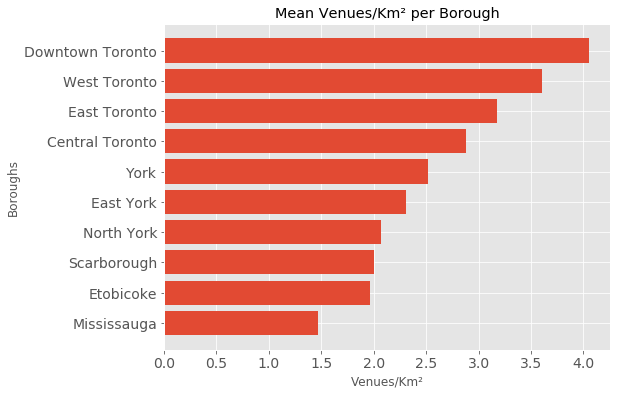

In [36]:
#Using matplotlib Bar chart Horizontal to visualize the DataFrame above
piegraph = pd.DataFrame(toronto_area1.groupby(by= 'Borough')['Venues/Km²'].mean()).reset_index()

piegraph=piegraph.sort_values(by='Venues/Km²',ascending = True)


plt.figure(figsize=(8, 6))

plt.style.use('ggplot')
plt.tick_params(labelsize=14)
plt.barh(piegraph['Borough'],piegraph['Venues/Km²'])
plt.title('Mean Venues/Km² per Borough')
plt.ylabel('Boroughs')
plt.xlabel('Venues/Km²')
plt.show()

In [37]:
#Calculate Neighborhood Mean
to_neigh = toronto_area1['Venues/Km²'].mean()
#Calculate Borough Mean
to_bor = toronto_area1.groupby(by='Borough').mean()['Venues/Km²'].mean()

Then, we will use folium to graph the geospatial coordinates of each venue using the **MarkerCluster plugin** to give us an idea and help us visualize the density of the venues in the form of clusters.

In [38]:
import folium
from folium import plugins

# create map
torontoareamap = folium.Map(location=[latitude_toronto, longitude_toronto], zoom_start=11)
markers = plugins.MarkerCluster().add_to(torontoareamap)

# loop through the 100 crimes and add each to the incidents feature group
for lat, lng, cat, name in zip(toronto_venues1['Venue Latitude'],toronto_venues1['Venue Longitude'], toronto_venues1['Venue'], toronto_venues1['Venue Category']):
    label = '{}, {}'.format(cat, name)
    label = folium.Popup(label, parse_html=True)
    folium.features.CircleMarker(
        [lat, lng],
        radius=5, # define how big you want the circle markers to be
        color='purple',
        fill=True,
        popup = label,
        fill_color ='red',
        fill_opacity=0.8,
        parse_html=False
    ).add_to(markers)
    
#show map
torontoareamap





#### New York City - Venues Density

In [39]:
#Select the duplicated rows of the dataframe
print('Duplicated Rows dimensions: {}'.format(newyork_area[newyork_area.duplicated(subset=['Neighborhood','Borough','Total Results'])].shape))
#Delete the duplicated rows of the dataframe
newyork_area1 =newyork_area.drop_duplicates(subset =['Neighborhood','Borough','Total Results'],
                     keep = "first")
print('Dimensions of the Final Dataframe: {}'.format(newyork_area1.shape))

newyork_area1.head()

Duplicated Rows dimensions: (4493, 6)
Dimensions of the Final Dataframe: (306, 6)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Borough,Total Results,Venues/Km²
0,Wakefield,40.894705,-73.847201,Bronx,9,5.73
9,Co-op City,40.874294,-73.829939,Bronx,17,10.82
26,Eastchester,40.887556,-73.827806,Bronx,23,14.64
46,Fieldston,40.895437,-73.905643,Bronx,4,2.55
50,Riverdale,40.890834,-73.912585,Bronx,9,5.73


In [40]:
#We group based on Borough and show the total amounts by Borough
newyork_area1.groupby(by= 'Borough')['Total Results'].sum().sort_values(ascending = False)

Borough
Manhattan        4311
Brooklyn         2883
Queens           2089
Bronx            1220
Staten Island     839
Name: Total Results, dtype: int64

In [41]:
#We perform the same grouping but we take the average of each feature for each Borough
newyork_area1.groupby(by= 'Borough')[['Total Results','Venues/Km²']].mean().sort_values(by='Venues/Km²',ascending = False)

,Total Results,Venues/Km²
Borough,,
Manhattan,107.775000,68.611750
Brooklyn,41.185714,26.220286
Queens,25.790123,16.419383
Bronx,23.461538,14.936923
Staten Island,13.317460,8.478571


As we can see on the graphs, with the help of the Foursquare API we found that there are more venues on the **Neighborhoods of Manhattan**, which is summarized in a greater density of venues within that Borough, and therefore a greater amount of Venues per square kilometer, as can be seen in the Features of "Total Results" and "Venues / Km²" in the New York Boroughs comparison table. Note that the results of Manhattan have a difference of more than double compared to the other boroughs.

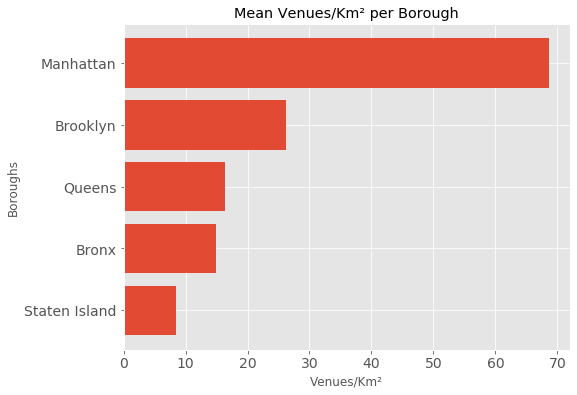

In [42]:
#Using matplotlib Bar chart Horizontal to visualize the DataFrame above
piegraph1 = pd.DataFrame(newyork_area1.groupby(by= 'Borough')['Venues/Km²'].mean()).reset_index()

piegraph1=piegraph1.sort_values(by='Venues/Km²',ascending = True)


plt.figure(figsize=(8, 6))

plt.style.use('ggplot')
plt.tick_params(labelsize=14)
plt.barh(piegraph1['Borough'],piegraph1['Venues/Km²'])
plt.title('Mean Venues/Km² per Borough')
plt.ylabel('Boroughs')
plt.xlabel('Venues/Km²')
plt.show()

In [43]:
#Calculate Neighborhood Mean
ny_neigh = newyork_area1['Venues/Km²'].mean()
#Calculate Borough Mean
ny_bor = newyork_area1.groupby(by='Borough').mean()['Venues/Km²'].mean()

Then, we will use folium to graph the geospatial coordinates of each venue using the **MarkerCluster plugin** to give us an idea and help us visualize the density of the venues in the form of clusters.

In [44]:
import folium
from folium import plugins

# create map
newyorkareamap = folium.Map(location=[latitude_ny, longitude_ny], zoom_start=11)

markers = plugins.MarkerCluster().add_to(newyorkareamap)

# loop through the 100 crimes and add each to the incidents feature group
for lat, lng, cat, name in zip(newyork_venues1['Venue Latitude'],newyork_venues1['Venue Longitude'], newyork_venues1['Venue'], newyork_venues1['Venue Category']):
    label = '{}, {}'.format(cat, name)
    label = folium.Popup(label, parse_html=True)
    folium.features.CircleMarker(
        [lat, lng],
        radius=5, # define how big you want the circle markers to be
        color='purple',
        fill=True,
        popup = label,
        fill_color ='red',
        fill_opacity=0.8,
        parse_html=False
    ).add_to(markers)
    
#show map
newyorkareamap



## Analysis Category Diversity<a id="5"></a>

<p style='text-align: justify;'>In this section, as the title says, we are going to analyze the diversity of the venues categories belonging to each city, grouping them into the main category to which each one belongs, and obtaining the total proportions of presence in each city. For this we will help ourselves with the JSON provided by Foursquare API, which is Foursquare Venue Category Hierarchy, in which there are more than 800 categories in 4 different levels. But our goal is to group them at the first level of the category hierarchy where there are 10 categories of venues, which will help us to group each of the venues.

In [45]:
#Proceed to download the JSON file with all the Venue Categories Hierarchy from Foursquare 
# create the API request URL
url = 'https://api.foursquare.com/v2/venues/categories?&client_id={}&client_secret={}&v={}&oauth_token={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET,VERSION, 
            ACCESS_TOKEN)
            
# make the GET request
result = requests.get(url).json()
result
        
        

{'meta': {'code': 200, 'requestId': '601c09e91cd156130c296051'},
 'notifications': [{'type': 'notificationTray', 'item': {'unreadCount': 0}}],
 'response': {'categories': [{'id': '4d4b7104d754a06370d81259',
    'name': 'Arts & Entertainment',
    'pluralName': 'Arts & Entertainment',
    'shortName': 'Arts & Entertainment',
    'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/default_',
     'suffix': '.png'},
    'categories': [{'id': '56aa371be4b08b9a8d5734db',
      'name': 'Amphitheater',
      'pluralName': 'Amphitheaters',
      'shortName': 'Amphitheater',
      'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/default_',
       'suffix': '.png'},
      'categories': []},
     {'id': '4fceea171983d5d06c3e9823',
      'name': 'Aquarium',
      'pluralName': 'Aquariums',
      'shortName': 'Aquarium',
      'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/aquarium_',
       'suffix': '.png'},
   

In [46]:
#Let's traslate the JSON file of the Hierarchy  to a Dataframe with the different levels of hierarchy
categorie_list = []
for i in range(0,10):
    items1 = result['response']['categories'][i]
    name1 = result['response']['categories'][i]['name']
    for j in range(0,200):
        try:
            items2 = items1['categories'][j]
            name2 = items1['categories'][j]['name']
            for k in range(0,200):
                try:
                    items3 = items2['categories'][k]
                    name3 = items2['categories'][k]['name']
                    for m in range(0,200):
                        try:
                            items4 = items3['categories'][m]
                            name4 = items3['categories'][m]['name']
                            categorie_list.append([(name1,name2,name3,name4)])
                        except:
                            categorie_list.append([(name1,name2,name3,'NaN')])
                            break
                            
                except:
                    categorie_list.append([(name1,name2,'NaN','NaN')])
                    break
        except:
            categorie_list.append([(name1,'NaN','NaN','NaN')])
            break

category_hier = pd.DataFrame([item for categorie_list in categorie_list for item in categorie_list])
category_hier.columns = ['First Level','Second Level','Third Level','Forth Level']
category_hier.head()
    

,First Level,Second Level,Third Level,Forth Level
0,Arts & Entertainment,Amphitheater,NaN,NaN
1,Arts & Entertainment,Aquarium,NaN,NaN
2,Arts & Entertainment,Arcade,NaN,NaN
3,Arts & Entertainment,Art Gallery,NaN,NaN
4,Arts & Entertainment,Bowling Alley,NaN,NaN


Now, let's build a function that allows us to search for the first level category that belongs to each venue in each city respectively, making use of the previous dataframe of the hierarchical categories, and finally append this information to the Venues Dataframe and perform the corresponding analysis.

In [47]:
#Function to search for the main category of each venue
def maincategories_venues(dataframe):
    to_flvl = []
    hierk = category_hier.columns.tolist()
    to_cat = dataframe['Venue Category'].tolist()
    counteras = 0

    for cat in to_cat:
        try:
            itm = category_hier[category_hier['First Level']== cat].iloc[0,0]
            to_flvl.append(itm)
        except:
            try:
                itm = category_hier[category_hier['Second Level']== cat].iloc[0,0]
                to_flvl.append(itm)
            except:
                try:
                    itm = category_hier[category_hier['Third Level']== cat].iloc[0,0]
                    to_flvl.append(itm)
                except:
                    try:
                        itm = category_hier[category_hier['Forth Level']== cat].iloc[0,0]
                        to_flvl.append(itm)
                    except:
                        counteras +=1           
                        print('Category not found: {}  '.format(cat))
                        to_flvl.append('NaN')
                        continue

    print('\n {} de {}  total Main categories were found.'.format(len(to_cat)-counteras,len(to_cat)))  
    dataframe.insert(7, 'Main Category', to_flvl, True)
    return dataframe 

### Toronto City Categories

In [48]:
#We start looking for the main categories of the venues from the Toronto City 
toronto_venues1 = maincategories_venues(toronto_venues1)


 3372 de 3372  total Main categories were found.


In [49]:
#We check the new Column called Main Category that we added above
print(toronto_venues1.shape)
toronto_venues1.head()

(3372, 10)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Main Category,City,Venue ID
0,Parkwoods,43.753259,-79.329656,Allwyn's Bakery,43.759840,-79.324719,Caribbean Restaurant,Food,Toronto,4b8991cbf964a520814232e3
1,Parkwoods,43.753259,-79.329656,Donalda Golf & Country Club,43.752816,-79.342741,Golf Course,Outdoors & Recreation,Don Mills,4bd4846a6798ef3bd0c5618d
2,Parkwoods,43.753259,-79.329656,Tim Hortons,43.760668,-79.326368,Café,Food,Toronto,57e286f2498e43d84d92d34a
3,Parkwoods,43.753259,-79.329656,Galleria Supermarket,43.753520,-79.349518,Supermarket,Shop & Service,Toronto,4ccec87654f0b1f7f32824ca
4,Parkwoods,43.753259,-79.329656,Graydon Hall Manor,43.763923,-79.342961,Event Space,Professional & Other Places,Toronto,4b8ec91af964a520053733e3


In [50]:
#Then,we group all the venues by his Main Category, and we calculate the total proportions
to_maincat_df = pd.DataFrame(toronto_venues1.groupby(['Main Category']).count().sort_values(['Venue'],ascending = False)['Venue'])
to_maincat_df['Venue (%)'] = round((to_maincat_df['Venue']*100)/to_maincat_df['Venue'].sum(),1)
to_maincat_df

,Venue,Venue (%)
Main Category,,
Food,1926,57.1
Shop & Service,801,23.8
Outdoors & Recreation,328,9.7
Nightlife Spot,119,3.5
Arts & Entertainment,111,3.3
Travel & Transport,73,2.2
Professional & Other Places,12,0.4
College & University,2,0.1


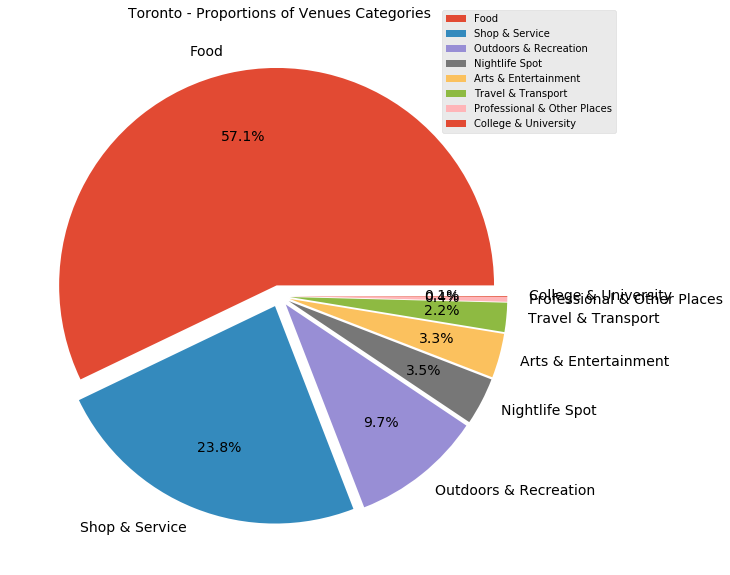

In [51]:
#Using matplotlib
to_maincat = toronto_venues1.groupby(['Main Category']).count().sort_values(['Venue'],ascending = False)['Venue']
pie, ax = plt.subplots(figsize=[20,10])
labels = to_maincat.keys()

plt.pie(x=to_maincat, autopct="%.1f%%", explode=[0.05]*len(labels), labels=labels, pctdistance=0.7,textprops={'fontsize': 14})
plt.legend( labels, loc=[0.8,0.8])
plt.title("Toronto - Proportions of Venues Categories", fontsize=14);


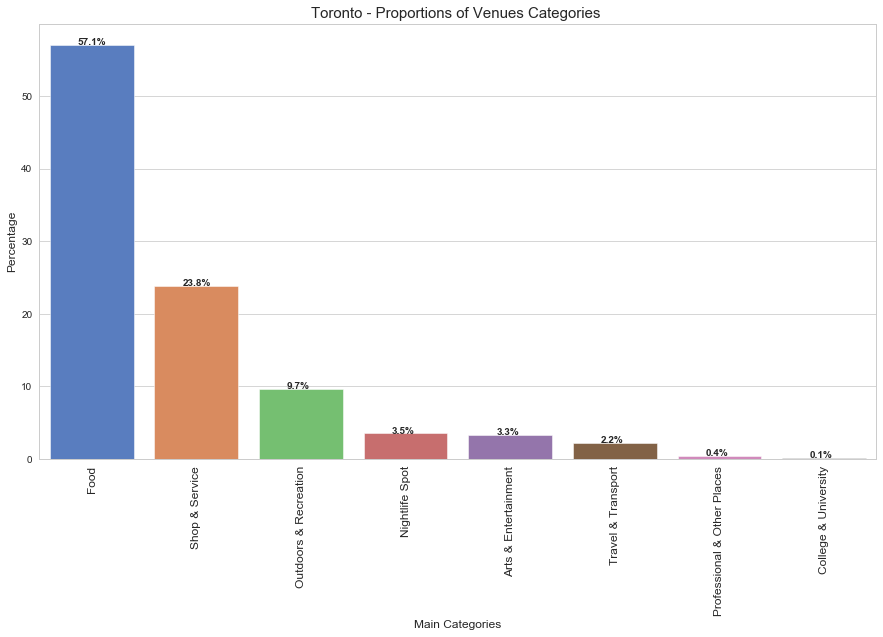

In [52]:
#Seaborn barplot
import seaborn 
import seaborn as sns
sns.set_style("whitegrid")
bar,ax = plt.subplots(figsize=(15,8))
ax = sns.barplot(x=to_maincat_df.index, y='Venue (%)', data=to_maincat_df, ci=None, palette="muted",orient='v', )

ax.set_title("Toronto - Proportions of Venues Categories ", fontsize=15)
ax.set_xlabel ("Main Categories")
plt.setp(ax.get_xticklabels(), rotation=90, fontsize = 12)
ax.set_ylabel ("Percentage")
# calculate the percentages and annotate the sns barplot
for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width() / 3,rect.get_height(),"%.1f%%"% rect.get_height(), weight='bold' )

As we can see, for the **city of Toronto**, we notice a high presence of venues that belong to the **Food category**, where we find a percentage greater than 50% of the total proportion, **57.1%** to be exact. In second place, we have the **Shop & Service** category with a **23.8%** presence, and thirdly, we have the **Outdoors & Recreation category** with a **9.8%** presence percentage.

### New York City Categories

In [53]:
#We start looking for the main categories of the venues from the New York City 
newyork_venues1 = maincategories_venues(newyork_venues1)


 4688 de 4688  total Main categories were found.


In [54]:
#We check the new Column called Main Category that we added above
print(newyork_venues1.shape)
newyork_venues1.head()

(4688, 10)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Main Category,City,Venue ID
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop,Food,Bronx,4c537892fd2ea593cb077a28
1,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop,Food,Bronx,4c783cef3badb1f7e4244b54
2,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy,Shop & Service,Bronx,5d5f5044d0ae1c0008f043c3
3,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy,Shop & Service,Bronx,4d6af9426107f04dedeb297a
4,Wakefield,40.894705,-73.847201,Dunkin',40.890459,-73.849089,Donut Shop,Food,Bronx,4c25c212f1272d7f836385c5


In [55]:
#Then,we group all the venues by his Main Category, and we calculate the total proportions
ny_maincat_df = pd.DataFrame(newyork_venues1.groupby(['Main Category']).count().sort_values(['Venue'],ascending = False)['Venue'])
ny_maincat_df['Venue (%)'] = round((ny_maincat_df['Venue']*100)/ny_maincat_df['Venue'].sum(),2)
ny_maincat_df


,Venue,Venue (%)
Main Category,,
Food,2491,53.14
Shop & Service,1058,22.57
Outdoors & Recreation,490,10.45
Nightlife Spot,246,5.25
Travel & Transport,216,4.61
Arts & Entertainment,141,3.01
Professional & Other Places,37,0.79
College & University,5,0.11
Residence,3,0.06


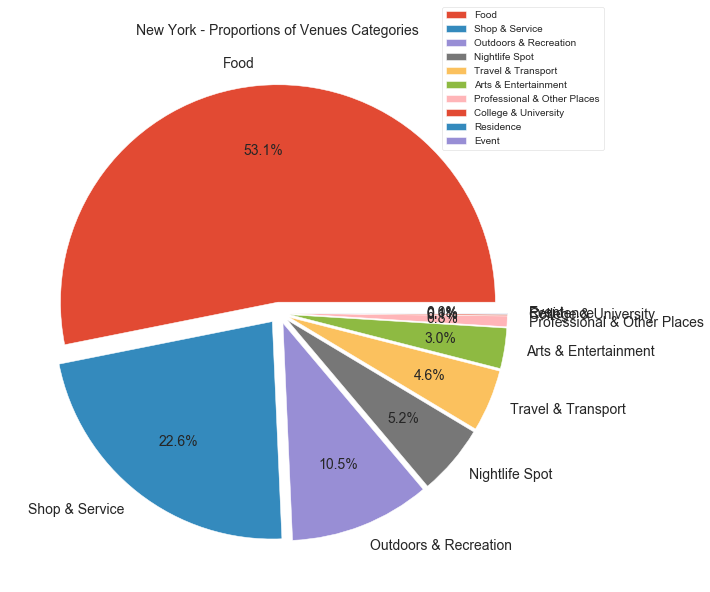

In [56]:
#Using matplotlib graph the categories proportions of New York City
ny_maincat = newyork_venues1.groupby(['Main Category']).count().sort_values(['Venue'],ascending = False)['Venue']
pie, ax = plt.subplots(figsize=[20,10])
labels = ny_maincat.keys()

plt.pie(x=ny_maincat, autopct="%.1f%%", explode=[0.05]*len(labels), labels=labels, pctdistance=0.7,textprops={'fontsize': 14})
plt.legend( labels, loc=[0.8,0.8])
plt.title("New York - Proportions of Venues Categories ", fontsize=14);

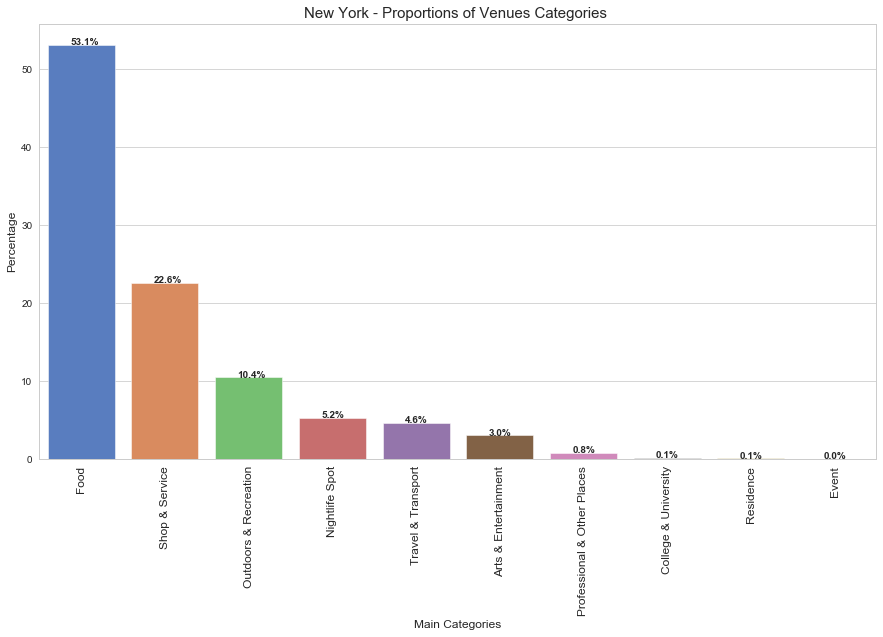

In [57]:
#Seaborn barplot
sns.set_style("whitegrid")
bar,ax = plt.subplots(figsize=(15,8))
ax = sns.barplot(x=ny_maincat_df.index, y='Venue (%)', data=ny_maincat_df, ci=None, palette="muted",orient='v', )

ax.set_title("New York - Proportions of Venues Categories ", fontsize=15)
ax.set_xlabel ("Main Categories")
plt.setp(ax.get_xticklabels(), rotation=90, fontsize = 12)
ax.set_ylabel ("Percentage")
# calculate the percentages and annotate the sns barplot
for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width() / 3,rect.get_height(),"%.1f%%"% rect.get_height(), weight='bold' )

As we can see, for the **city of New York**, we notice a high presence of venues that belong to the **Food category**, where we find a percentage greater than 50% of the total proportion, **53.1%** to be exact. In second place, we have the **Shop & Service** category with a **23%** presence, and thirdly, we have the **Outdoors & Recreation** category with a **10.2%** presence percentage.

### Analyzing by Neighborhoods - Clustering  <a id="6"></a>

<p style='text-align: justify;'>Now, we will use the k-means clustering algorithm to group the neighborhoods into clusters. In order to perform the grouping through the k-means algorithm based on the main category of the venues, we will make the grouping in 3 clusters and with this we will be able to know at the Neighborhoods level which are the 3 main categories of venues that are most common in each city And finally, we will use the Folium library to visualize the neighborhoods in New York City and their emerging clusters.

For the above described, let's build two functions, one function to sort the venues in descending order. And the second one to create 2 dataframe, one of  the top 10 venues for each neighborhood and another grouping by neighborhood and by taking the mean of the frequency of occurrence of each category.

In [58]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]


def top10venues_sorted(dataframe,num_top_venues = 10):
    # one hot encoding
    df_onehot = pd.get_dummies(dataframe[['Main Category']], prefix="", prefix_sep="")

    # add neighborhood column back to dataframe
    df_onehot['Neighborhood'] = dataframe['Neighborhood'] 

    # move neighborhood column to the first column
    fixed_columns = [df_onehot.columns[-1]] + list(df_onehot.columns[:-1])
    df_onehot = df_onehot[fixed_columns]

    df_grouped = df_onehot.groupby('Neighborhood').mean().reset_index()
    
    indicators = ['st', 'nd', 'rd']

    # create columns according to number of top venues
    columns = ['Neighborhood']
    for ind in np.arange(num_top_venues):
        try:
            columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
        except:
            columns.append('{}th Most Common Venue'.format(ind+1))

    # create a new dataframe
    neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
    neighborhoods_venues_sorted['Neighborhood'] = df_grouped['Neighborhood']

    for ind in np.arange(df_grouped.shape[0]):
        neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(df_grouped.iloc[ind, :], num_top_venues)

    return df_grouped, neighborhoods_venues_sorted


#### Toronto City

Let's apply the function to create new dataframes with the venues dataframe, but first we will check the unique values on the Main Category for apply the function since the quantity of values have to be the same as the number of columns( most commons venues), and then we will check the dataframe grouped by neighborhood and the dimensions.

In [59]:
toronto_venues1['Main Category'].unique().shape

(8,)

There's 8 unique values, so we will insert 8 as the second input of the function.

In [60]:
toronto_grouped, toronto_venues_sorted = top10venues_sorted(toronto_venues1,8)
print(toronto_grouped.shape)
toronto_grouped.head()


(94, 9)


,Neighborhood,Arts & Entertainment,College & University,Food,Nightlife Spot,Outdoors & Recreation,Professional & Other Places,Shop & Service,Travel & Transport
0,Agincourt,0.000000,0.0,0.771429,0.028571,0.000000,0.000000,0.200000,0.000000
1,"Alderwood, Long Branch",0.028169,0.0,0.507042,0.028169,0.042254,0.014085,0.380282,0.000000
2,"Bathurst Manor, Wilson Heights, Downsview North",0.053191,0.0,0.638298,0.031915,0.170213,0.010638,0.085106,0.010638
3,Bayview Village,0.000000,0.0,0.660377,0.000000,0.018868,0.000000,0.301887,0.018868
4,"Bedford Park, Lawrence Manor East",0.000000,0.0,0.585366,0.024390,0.073171,0.000000,0.317073,0.000000


Next, let's check the dataframe of the top 10 venues sorted and the dimensions.

In [61]:
print(toronto_venues_sorted.shape)
toronto_venues_sorted.head()

(94, 9)


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue
0,Agincourt,Food,Shop & Service,Nightlife Spot,Travel & Transport,Professional & Other Places,Outdoors & Recreation,College & University,Arts & Entertainment
1,"Alderwood, Long Branch",Food,Shop & Service,Outdoors & Recreation,Nightlife Spot,Arts & Entertainment,Professional & Other Places,Travel & Transport,College & University
2,"Bathurst Manor, Wilson Heights, Downsview North",Food,Outdoors & Recreation,Shop & Service,Arts & Entertainment,Nightlife Spot,Travel & Transport,Professional & Other Places,College & University
3,Bayview Village,Food,Shop & Service,Travel & Transport,Outdoors & Recreation,Professional & Other Places,Nightlife Spot,College & University,Arts & Entertainment
4,"Bedford Park, Lawrence Manor East",Food,Shop & Service,Outdoors & Recreation,Nightlife Spot,Travel & Transport,Professional & Other Places,College & University,Arts & Entertainment


It looks good. There are 8 positions as we initially established,  now let's procced with the clustering algorithm.

#### Clustering 

It's time to use the machine learning algorithm, let's run k-means to cluster the neighborhood into 5 clusters. And for that we will merge the above similar dataframes from both cities into a Master Dataframe to run the k-means algorithm.


In [62]:
# set number of clusters
kclusters = 3

toronto_grouped_clustering = toronto_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(toronto_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([1, 0, 1, 0, 0, 2, 0, 1, 0, 2])

Now, since we already have the cluster labels array, let's add a cluster labels column, borough and the geospatial coordinates of the neighborhood to the top 10 venues sorted dataframe that we created before so we can identify them.

In [63]:
# add clustering labels
toronto_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)


toronto_merged = toronto_cluster.drop('Postal Code',1)

# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
toronto_merged = toronto_merged.join(toronto_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

 # check the last columns!

In [64]:
toronto_merged.isnull().any().any()

True

Let's delete the NaN values on the dataframe and also let's transform the cluster labels (float values) to integers

In [65]:
# We check the clusters created
toronto_merged.dropna(axis=0, inplace = True)
toronto_merged['Cluster Labels'] = toronto_merged['Cluster Labels'].astype(int)

print(toronto_merged['Cluster Labels'].unique())

toronto_merged.head()

[1 0 2]


,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue
0,North York,Parkwoods,43.753259,-79.329656,1,Food,Shop & Service,Outdoors & Recreation,Travel & Transport,Arts & Entertainment,Professional & Other Places,Nightlife Spot,College & University
1,North York,Victoria Village,43.725882,-79.315572,0,Food,Shop & Service,Arts & Entertainment,Outdoors & Recreation,Nightlife Spot,Travel & Transport,Professional & Other Places,College & University
2,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636,0,Food,Outdoors & Recreation,Shop & Service,Arts & Entertainment,Travel & Transport,Nightlife Spot,Professional & Other Places,College & University
3,North York,"Lawrence Manor, Lawrence Heights",43.718518,-79.464763,0,Food,Shop & Service,Outdoors & Recreation,Arts & Entertainment,Travel & Transport,Nightlife Spot,Professional & Other Places,College & University
4,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494,1,Food,Shop & Service,Arts & Entertainment,Outdoors & Recreation,Nightlife Spot,Travel & Transport,Professional & Other Places,College & University


The final Dataframe, It's looking good, we can see the Cluster Labels with the Neighborhood/Borough and geospatials coordinates respective. Finally, let's visualize the resulting clusters.

In [66]:
# create map

map_clusters = folium.Map(location=[latitude_toronto, longitude_toronto], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(toronto_merged['Latitude'], toronto_merged['Longitude'], toronto_merged['Neighborhood'], toronto_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

#### Examine clusters

Let's procced to examine each cluster created. cluster and determine the discriminating venue main categories that distinguish each cluster, based on the defining categories.

#### Cluster 0 

In [67]:
toronto_merged.loc[toronto_merged['Cluster Labels'] == 0, toronto_merged.columns[[0,1] + list(range(4, toronto_merged.shape[1]))]]

,Borough,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue
1,North York,Victoria Village,0,Food,Shop & Service,Arts & Entertainment,Outdoors & Recreation,Nightlife Spot,Travel & Transport,Professional & Other Places,College & University
2,Downtown Toronto,"Regent Park, Harbourfront",0,Food,Outdoors & Recreation,Shop & Service,Arts & Entertainment,Travel & Transport,Nightlife Spot,Professional & Other Places,College & University
3,North York,"Lawrence Manor, Lawrence Heights",0,Food,Shop & Service,Outdoors & Recreation,Arts & Entertainment,Travel & Transport,Nightlife Spot,Professional & Other Places,College & University
5,Etobicoke,"Islington Avenue, Humber Valley Village",0,Food,Shop & Service,Outdoors & Recreation,Nightlife Spot,Arts & Entertainment,Travel & Transport,Professional & Other Places,College & University
6,Scarborough,"Malvern, Rouge",0,Food,Shop & Service,Arts & Entertainment,Outdoors & Recreation,Travel & Transport,Nightlife Spot,Professional & Other Places,College & University
7,North York,Don Mills,0,Shop & Service,Food,Outdoors & Recreation,Nightlife Spot,Arts & Entertainment,Travel & Transport,Professional & Other Places,College & University
8,East York,"Parkview Hill, Woodbine Gardens",0,Food,Shop & Service,Outdoors & Recreation,Nightlife Spot,Travel & Transport,Professional & Other Places,College & University,Arts & Entertainment
11,Etobicoke,"West Deane Park, Princess Gardens, Martin Grov...",0,Food,Shop & Service,Outdoors & Recreation,College & University,Travel & Transport,Professional & Other Places,Nightlife Spot,Arts & Entertainment
12,Scarborough,"Rouge Hill, Port Union, Highland Creek",0,Food,Shop & Service,Outdoors & Recreation,Travel & Transport,Nightlife Spot,Professional & Other Places,College & University,Arts & Entertainment
13,North York,Don Mills,0,Shop & Service,Food,Outdoors & Recreation,Nightlife Spot,Arts & Entertainment,Travel & Transport,Professional & Other Places,College & University


Most common venue category of the cluster: **Food / Shop & Service**

#### Cluster 1

In [68]:
toronto_merged.loc[toronto_merged['Cluster Labels'] == 1, toronto_merged.columns[[0,1] + list(range(4, toronto_merged.shape[1]))]]

,Borough,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue
0,North York,Parkwoods,1,Food,Shop & Service,Outdoors & Recreation,Travel & Transport,Arts & Entertainment,Professional & Other Places,Nightlife Spot,College & University
4,Downtown Toronto,"Queen's Park, Ontario Provincial Government",1,Food,Shop & Service,Arts & Entertainment,Outdoors & Recreation,Nightlife Spot,Travel & Transport,Professional & Other Places,College & University
10,North York,Glencairn,1,Food,Outdoors & Recreation,Shop & Service,Travel & Transport,Professional & Other Places,Nightlife Spot,College & University,Arts & Entertainment
14,East York,Woodbine Heights,1,Food,Nightlife Spot,Outdoors & Recreation,Shop & Service,Arts & Entertainment,Travel & Transport,Professional & Other Places,College & University
16,York,Humewood-Cedarvale,1,Food,Outdoors & Recreation,Shop & Service,Nightlife Spot,Arts & Entertainment,Professional & Other Places,Travel & Transport,College & University
21,York,Caledonia-Fairbanks,1,Food,Shop & Service,Nightlife Spot,Outdoors & Recreation,Travel & Transport,Professional & Other Places,College & University,Arts & Entertainment
25,Downtown Toronto,Christie,1,Food,Outdoors & Recreation,Nightlife Spot,Shop & Service,Travel & Transport,Professional & Other Places,College & University,Arts & Entertainment
28,North York,"Bathurst Manor, Wilson Heights, Downsview North",1,Food,Outdoors & Recreation,Shop & Service,Arts & Entertainment,Nightlife Spot,Travel & Transport,Professional & Other Places,College & University
30,Downtown Toronto,"Richmond, Adelaide, King",1,Food,Outdoors & Recreation,Travel & Transport,Shop & Service,Professional & Other Places,Nightlife Spot,College & University,Arts & Entertainment
31,West Toronto,"Dufferin, Dovercourt Village",1,Food,Nightlife Spot,Shop & Service,Outdoors & Recreation,Arts & Entertainment,Travel & Transport,Professional & Other Places,College & University


Most common venue category of the cluster: **Food, Shop & Service**

#### Cluster 2

In [69]:
toronto_merged.loc[toronto_merged['Cluster Labels'] == 2, toronto_merged.columns[[0,1] + list(range(4, toronto_merged.shape[1]))]]

,Borough,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue
9,Downtown Toronto,"Garden District, Ryerson",2,Outdoors & Recreation,Professional & Other Places,Nightlife Spot,Food,Arts & Entertainment,Travel & Transport,Shop & Service,College & University
20,Downtown Toronto,Berczy Park,2,Outdoors & Recreation,Food,Arts & Entertainment,Travel & Transport,Shop & Service,Professional & Other Places,Nightlife Spot,College & University
51,Scarborough,"Cliffside, Cliffcrest, Scarborough Village West",2,Outdoors & Recreation,Food,Nightlife Spot,Travel & Transport,Shop & Service,Professional & Other Places,College & University,Arts & Entertainment
66,North York,York Mills West,2,Outdoors & Recreation,Travel & Transport,Shop & Service,Professional & Other Places,Nightlife Spot,Food,College & University,Arts & Entertainment
69,West Toronto,"High Park, The Junction South",2,Outdoors & Recreation,Food,Shop & Service,Arts & Entertainment,Travel & Transport,Professional & Other Places,Nightlife Spot,College & University
75,West Toronto,"Parkdale, Roncesvalles",2,Outdoors & Recreation,Shop & Service,Food,Travel & Transport,Professional & Other Places,Nightlife Spot,College & University,Arts & Entertainment
87,Downtown Toronto,"CN Tower, King and Spadina, Railway Lands, Har...",2,Outdoors & Recreation,Food,Shop & Service,Travel & Transport,Professional & Other Places,Nightlife Spot,College & University,Arts & Entertainment
95,Scarborough,Upper Rouge,2,Arts & Entertainment,Outdoors & Recreation,Shop & Service,Travel & Transport,Professional & Other Places,Nightlife Spot,Food,College & University


Most common venue category of the cluster: **Outdoors & Recreation / Food**

And finally, having applied the k means algorithm for grouping by cluster, we can confirm that the previous analysis on the proportions of categories of the premises of the city of Toronto coincides with the most common categories within the clusters, where the categories Food, Shop & Service and Outdoors & Recreation are the categories that head the table of proportions, which coincides with the results obtained.

#### New York City

Let's repeat the previous process to this city. Let's apply the function to create new dataframes with the venues dataframe, but first we will check the unique values on the Main Category for apply the function since the quantity of values have to be the same as the number of columns( most commons venues), and then we will check the dataframe grouped by neighborhood and the dimensions.

In [70]:
newyork_venues1['Main Category'].unique().shape

(10,)

There's 10 unique values, so we can insert 10 as the second input of the function.

In [71]:
newyork_grouped, newyork_venues_sorted = top10venues_sorted(newyork_venues1,10)
print(newyork_venues_sorted.shape)
newyork_venues_sorted.head()


(306, 11)


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Allerton,Food,Shop & Service,Outdoors & Recreation,Travel & Transport,Residence,Professional & Other Places,Nightlife Spot,Event,College & University,Arts & Entertainment
1,Annadale,Food,Shop & Service,Travel & Transport,Outdoors & Recreation,Nightlife Spot,Arts & Entertainment,Residence,Professional & Other Places,Event,College & University
2,Arden Heights,Food,Travel & Transport,Shop & Service,Residence,Professional & Other Places,Outdoors & Recreation,Nightlife Spot,Event,College & University,Arts & Entertainment
3,Arlington,Travel & Transport,Shop & Service,Food,Residence,Professional & Other Places,Outdoors & Recreation,Nightlife Spot,Event,College & University,Arts & Entertainment
4,Arrochar,Food,Travel & Transport,Shop & Service,Outdoors & Recreation,Residence,Professional & Other Places,Nightlife Spot,Event,College & University,Arts & Entertainment


As we can see there are 10 positions as we initially established, now let's procced with the clustering algorithm.

In [72]:
print(newyork_grouped.shape)
newyork_grouped.head()


(306, 11)


,Neighborhood,Arts & Entertainment,College & University,Event,Food,Nightlife Spot,Outdoors & Recreation,Professional & Other Places,Residence,Shop & Service,Travel & Transport
0,Allerton,0.000000,0.0,0.0,0.55,0.000000,0.100000,0.0,0.0,0.350000,0.000000
1,Annadale,0.071429,0.0,0.0,0.50,0.071429,0.071429,0.0,0.0,0.214286,0.071429
2,Arden Heights,0.000000,0.0,0.0,0.60,0.000000,0.000000,0.0,0.0,0.200000,0.200000
3,Arlington,0.000000,0.0,0.0,0.25,0.000000,0.000000,0.0,0.0,0.250000,0.500000
4,Arrochar,0.000000,0.0,0.0,0.60,0.000000,0.100000,0.0,0.0,0.150000,0.150000


Both dataframes looks good, so now, we can procced to the next part.

#### Clustering

In [73]:
# set number of clusters
kclusters = 3

newyork_grouped_clustering = newyork_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(newyork_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 


array([2, 2, 0, 2, 0, 1, 0, 2, 2, 0])

Now, since we already have the cluster labels array, let's add a cluster labels column, Borough and the geospatial coordinates of the neighborhood to the master dataframe that we created before so we can identify them.

In [74]:
# add clustering labels
newyork_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)


newyork_merged = newyork_cluster
# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
newyork_merged = newyork_merged.join(newyork_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

 # check the last columns!

In [75]:
newyork_merged.isnull().any().any()


False

Let's delete any NaN values on the dataframe and also let's transform the cluster labels (float values) to integers

In [76]:
# We check the clusters created
newyork_merged.dropna(axis=0, inplace = True)
newyork_merged['Cluster Labels'] = newyork_merged['Cluster Labels'].astype(int)

print(newyork_merged['Cluster Labels'].unique())

newyork_merged.head()

[0 1 2]


,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bronx,Wakefield,40.894705,-73.847201,0,Food,Shop & Service,Travel & Transport,Residence,Professional & Other Places,Outdoors & Recreation,Nightlife Spot,Event,College & University,Arts & Entertainment
1,Bronx,Co-op City,40.874294,-73.829939,1,Shop & Service,Outdoors & Recreation,Food,Travel & Transport,Professional & Other Places,Nightlife Spot,Residence,Event,College & University,Arts & Entertainment
2,Bronx,Eastchester,40.887556,-73.827806,0,Food,Travel & Transport,Shop & Service,Arts & Entertainment,Residence,Professional & Other Places,Outdoors & Recreation,Nightlife Spot,Event,College & University
3,Bronx,Fieldston,40.895437,-73.905643,1,Outdoors & Recreation,Travel & Transport,Arts & Entertainment,Shop & Service,Residence,Professional & Other Places,Nightlife Spot,Food,Event,College & University
4,Bronx,Riverdale,40.890834,-73.912585,1,Outdoors & Recreation,Travel & Transport,Shop & Service,Residence,Professional & Other Places,Nightlife Spot,Food,Event,College & University,Arts & Entertainment


The final Dataframe, It's looking good, we can see the Cluster Labels with the Neighborhood/Borough and geospatials coordinates respective. Finally, let's visualize the resulting clusters.

In [77]:
# create map

map_clusters = folium.Map(location=[latitude_ny, longitude_ny], zoom_start=10)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(newyork_merged['Latitude'], newyork_merged['Longitude'], newyork_merged['Neighborhood'], newyork_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

#### Examine clusters 

#### Cluster 0 

In [78]:
newyork_merged.loc[newyork_merged['Cluster Labels'] == 0, newyork_merged.columns[[0,1] + list(range(4, newyork_merged.shape[1]))]]

,Borough,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bronx,Wakefield,0,Food,Shop & Service,Travel & Transport,Residence,Professional & Other Places,Outdoors & Recreation,Nightlife Spot,Event,College & University,Arts & Entertainment
2,Bronx,Eastchester,0,Food,Travel & Transport,Shop & Service,Arts & Entertainment,Residence,Professional & Other Places,Outdoors & Recreation,Nightlife Spot,Event,College & University
5,Bronx,Kingsbridge,0,Food,Shop & Service,Nightlife Spot,Outdoors & Recreation,Travel & Transport,Residence,Professional & Other Places,Event,College & University,Arts & Entertainment
11,Bronx,Pelham Parkway,0,Food,Shop & Service,Travel & Transport,Outdoors & Recreation,Arts & Entertainment,Residence,Professional & Other Places,Nightlife Spot,Event,College & University
13,Bronx,Bedford Park,0,Food,Shop & Service,Outdoors & Recreation,Nightlife Spot,Travel & Transport,Residence,Professional & Other Places,Event,College & University,Arts & Entertainment
14,Bronx,University Heights,0,Food,Shop & Service,Arts & Entertainment,Travel & Transport,Residence,Professional & Other Places,Outdoors & Recreation,Nightlife Spot,Event,College & University
24,Bronx,Hunts Point,0,Food,Shop & Service,Professional & Other Places,Travel & Transport,Residence,Outdoors & Recreation,Nightlife Spot,Event,College & University,Arts & Entertainment
28,Bronx,Throgs Neck,0,Food,Nightlife Spot,Shop & Service,Travel & Transport,Residence,Professional & Other Places,Outdoors & Recreation,Event,College & University,Arts & Entertainment
31,Bronx,Westchester Square,0,Food,Shop & Service,Nightlife Spot,Outdoors & Recreation,Arts & Entertainment,Travel & Transport,Residence,Professional & Other Places,Event,College & University
32,Bronx,Van Nest,0,Food,Travel & Transport,Shop & Service,Outdoors & Recreation,Nightlife Spot,Residence,Professional & Other Places,Event,College & University,Arts & Entertainment


Most common venue category of the cluster: **Food / Shop & Service** 

#### Cluster 1

In [79]:
newyork_merged.loc[newyork_merged['Cluster Labels'] == 1, newyork_merged.columns[[1] + list(range(4, newyork_merged.shape[1]))]]

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,Co-op City,1,Shop & Service,Outdoors & Recreation,Food,Travel & Transport,Professional & Other Places,Nightlife Spot,Residence,Event,College & University,Arts & Entertainment
3,Fieldston,1,Outdoors & Recreation,Travel & Transport,Arts & Entertainment,Shop & Service,Residence,Professional & Other Places,Nightlife Spot,Food,Event,College & University
4,Riverdale,1,Outdoors & Recreation,Travel & Transport,Shop & Service,Residence,Professional & Other Places,Nightlife Spot,Food,Event,College & University,Arts & Entertainment
9,Williamsbridge,1,Nightlife Spot,Food,Outdoors & Recreation,Travel & Transport,Shop & Service,Residence,Professional & Other Places,Event,College & University,Arts & Entertainment
27,Clason Point,1,Outdoors & Recreation,Shop & Service,Travel & Transport,Food,Residence,Professional & Other Places,Nightlife Spot,Event,College & University,Arts & Entertainment
29,Country Club,1,Outdoors & Recreation,Food,Shop & Service,Travel & Transport,Residence,Professional & Other Places,Nightlife Spot,Event,College & University,Arts & Entertainment
35,Spuyten Duyvil,1,Outdoors & Recreation,Shop & Service,Food,Travel & Transport,Residence,Professional & Other Places,Nightlife Spot,Event,College & University,Arts & Entertainment
60,Brownsville,1,Food,Outdoors & Recreation,Shop & Service,Travel & Transport,Arts & Entertainment,Residence,Professional & Other Places,Nightlife Spot,Event,College & University
76,Mill Island,1,Outdoors & Recreation,Travel & Transport,Shop & Service,Residence,Professional & Other Places,Nightlife Spot,Food,Event,College & University,Arts & Entertainment
77,Manhattan Beach,1,Food,Outdoors & Recreation,Travel & Transport,Shop & Service,Residence,Professional & Other Places,Nightlife Spot,Event,College & University,Arts & Entertainment


Most common venue category of the cluster: **Food / Shop & Service**

#### Cluster 2

In [80]:
newyork_merged.loc[newyork_merged['Cluster Labels'] == 2, newyork_merged.columns[[1] + list(range(4, newyork_merged.shape[1]))]]

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
6,Marble Hill,2,Food,Shop & Service,Outdoors & Recreation,Arts & Entertainment,Travel & Transport,Residence,Professional & Other Places,Nightlife Spot,Event,College & University
7,Woodlawn,2,Food,Shop & Service,Nightlife Spot,Travel & Transport,Outdoors & Recreation,Residence,Professional & Other Places,Event,College & University,Arts & Entertainment
8,Norwood,2,Food,Shop & Service,Outdoors & Recreation,Travel & Transport,Residence,Professional & Other Places,Nightlife Spot,Event,College & University,Arts & Entertainment
10,Baychester,2,Shop & Service,Food,Travel & Transport,Outdoors & Recreation,Arts & Entertainment,Residence,Professional & Other Places,Nightlife Spot,Event,College & University
12,City Island,2,Food,Shop & Service,Arts & Entertainment,Nightlife Spot,Travel & Transport,Residence,Professional & Other Places,Outdoors & Recreation,Event,College & University
15,Morris Heights,2,Shop & Service,Food,Travel & Transport,Residence,Professional & Other Places,Outdoors & Recreation,Nightlife Spot,Event,College & University,Arts & Entertainment
16,Fordham,2,Food,Shop & Service,Outdoors & Recreation,Arts & Entertainment,Travel & Transport,Residence,Professional & Other Places,Nightlife Spot,Event,College & University
17,East Tremont,2,Food,Shop & Service,Nightlife Spot,Travel & Transport,Residence,Professional & Other Places,Outdoors & Recreation,Event,College & University,Arts & Entertainment
18,West Farms,2,Food,Travel & Transport,Outdoors & Recreation,Shop & Service,Nightlife Spot,Arts & Entertainment,Residence,Professional & Other Places,Event,College & University
19,High Bridge,2,Food,Shop & Service,Outdoors & Recreation,Travel & Transport,Residence,Professional & Other Places,Nightlife Spot,Event,College & University,Arts & Entertainment


Most common venue category of the cluster: **Outdoors & Recreation / Food**

And finally, having applied the k means algorithm for grouping by cluster, we can confirm that the previous analysis on the proportions of categories of the premises of the city of New York coincides with the most common categories within the clusters, where the categories Food, Shop & Service and Outdoors & Recreation are the categories that head the table of proportions, which coincides with the results obtained.

### Detailed Venues Analysis (Rating, Likes, Tips, Photos) <a id="7"></a>

Now we will use the dataframes initially obtained with the detailed information of each selected venue belonging to each city, on which we will mainly base the analysis on the Rating, Tip Count, Likes Count and Photos Count features. 

### Toronto City

First, let's check the dataframe with the detailed information of the selected venues of Toronto City.

In [81]:
#Show the Dataframe of Detailed information of the venues from Toronto City
toronto_detailedvenues.head()

,Venue Name,Categories,Verified,Latitude,Longitude,CC,City,Country,Rating,Tip Count,Likes Count,Photos Count
0,Cedarvale Park,Field,1,43.692535,-79.428705,CA,Toronto,Canada,9.3,7,38,65
1,Bellwoods Brewery,Brewery,1,43.647097,-79.419955,CA,Toronto,Canada,9.3,121,508,1038
2,Union Restaurant,New American Restaurant,1,43.645860,-79.419532,CA,Toronto,Canada,9.1,59,180,125
3,UNIQLO ユニクロ,Clothing Store,1,43.655910,-79.380641,CA,Toronto,Canada,8.9,10,114,72
4,Pizzeria Libretto,Pizza Place,1,43.648979,-79.420604,CA,Toronto,Canada,8.9,165,339,277


Check if there's any NaN value on any of the results, and we will drop the row since we can't input any other value. This happens sometimes because there's some venues that doesn't have a rating value or any other feature from the dataframe.

In [82]:
#We restart the index and we looking for any NaN values.
toronto_detailedvenues = toronto_detailedvenues.reset_index(drop=True)
toronto_detailedvenues.isnull().any()

Venue Name      False
Categories      False
Verified        False
Latitude        False
Longitude       False
CC              False
City            False
Country         False
Rating          False
Tip Count       False
Likes Count     False
Photos Count    False
dtype: bool

Now, let's calculate the mean values from the main parameters: Rating, Tip Count, Likes Count and Photos Count of the venues of Toronto, that we will analyze further.

In [83]:
#We calculate the mean from all the venues of Toronto
ratingto = toronto_detailedvenues['Rating'].mean()
tipcountto = toronto_detailedvenues['Tip Count'].mean()
likescountto = toronto_detailedvenues['Likes Count'].mean()
photoscountto = toronto_detailedvenues['Photos Count'].mean()

print('{} City  | DF_Dimensions:{} : \n\n Rating Average: {} \n Tip Count Average: {} \n Likes Count Average: {} \n Photos Count Average: {}'.format(toronto_detailedvenues['City'][0],toronto_detailedvenues.shape, ratingto,tipcountto,likescountto,photoscountto))

Toronto City  | DF_Dimensions:(164, 12) : 

 Rating Average: 7.604878048780487 
 Tip Count Average: 22.23170731707317 
 Likes Count Average: 75.6829268292683 
 Photos Count Average: 120.0609756097561


Now, let's use a count plot to see the quantity of venues rating values in the dataframe.

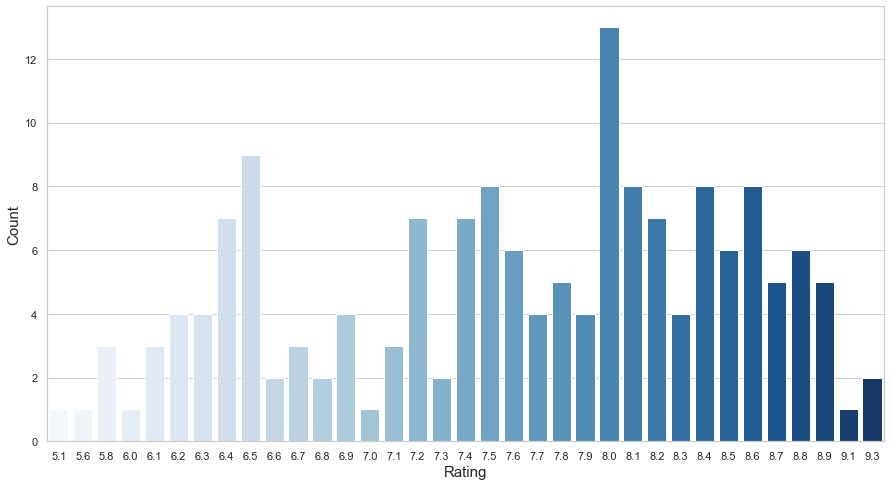

In [84]:
#Toronto City Venues Ratings Count
plt.figure(figsize=(15,8))
sns.set(style="whitegrid", color_codes=True)
# Make Seaborn countplot
axgif = sns.countplot(x="Rating", data=toronto_detailedvenues, palette="Blues")

axgif.set_xlabel("Rating",fontsize=15)
axgif.set_ylabel("Count",fontsize=15)

plt.show() 


Finally, let's graph, using count graphs, all these parameters to see if there is any notable relationship between them, taking into account that our first thought is that Rating is directly proportional to the other features, that means that, a higher Rating would mean a higher Like Count, Tip Count, Photo Count. Let's test it and figure out!

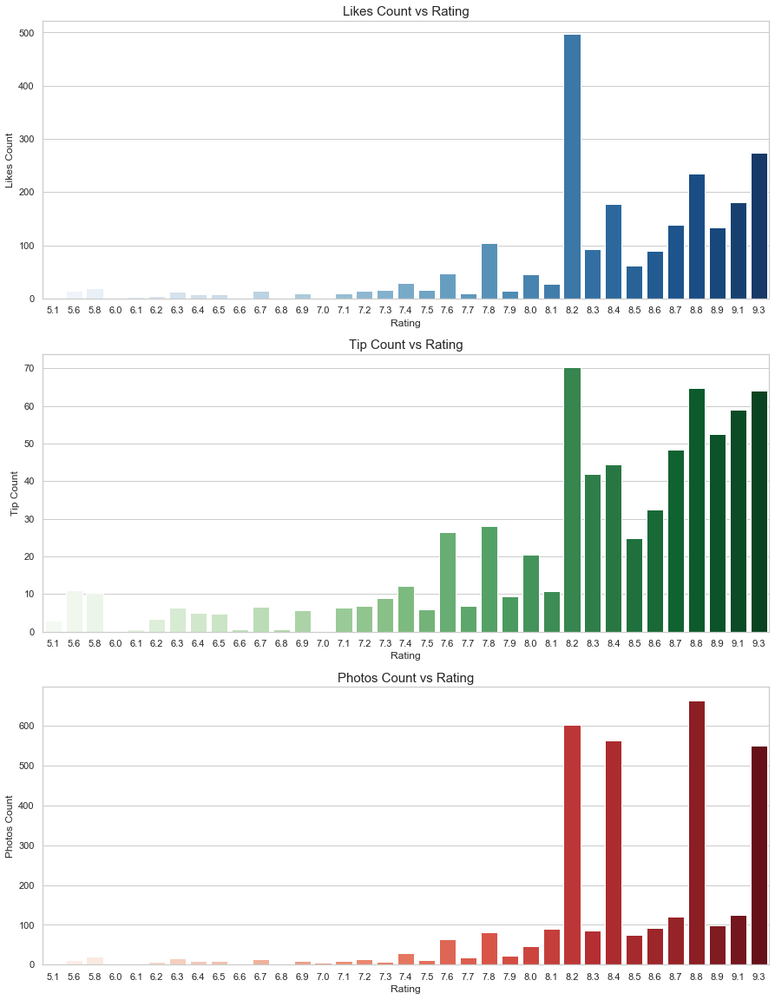

In [85]:
#Graphics between Rating vs Likes,Tips,Photo Counts - Venues of Toronto City
graphs0 = toronto_detailedvenues.groupby(by= 'Rating').mean().reset_index()
graphs0 = graphs0.loc[:,['Rating','Tip Count','Likes Count','Photos Count']]

fig, axs = plt.subplots(nrows = 3, ncols = 1, figsize = (15,20))

sns.set(style="whitegrid", color_codes=True)

# Make Seaborn countplot
sns.barplot(x="Rating",y= "Likes Count" ,data=graphs0, palette="Blues",ax=axs[0]).set_title('Likes Count vs Rating',fontsize=15)

sns.barplot(x="Rating",y= "Tip Count" ,data=graphs0, palette="Greens",ax=axs[1]).set_title('Tip Count vs Rating',fontsize=15)

sns.barplot(x="Rating",y= "Photos Count" ,data=graphs0, palette="Reds",ax=axs[2]).set_title('Photos Count vs Rating',fontsize=15)

plt.show()

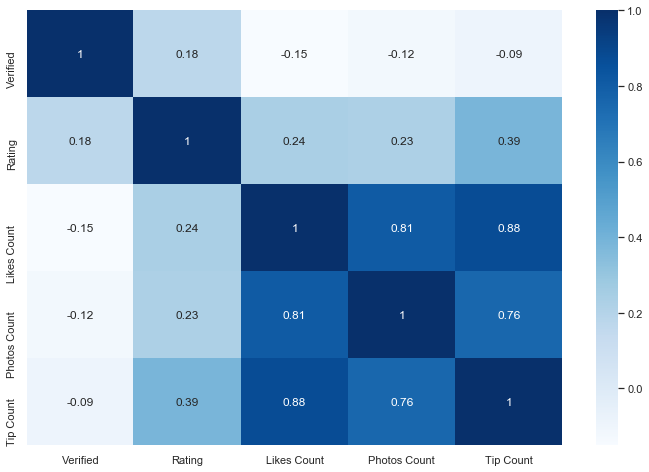

In [86]:
#Pearson Correlation 
#Using Pearson Correlation
toronto_detailedvenuescorr= toronto_detailedvenues.loc[:,('Verified','Rating','Likes Count','Photos Count', 'Tip Count')]
plt.figure(figsize=(12,8))
cor = toronto_detailedvenuescorr.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Blues)
plt.show()

Checking the graphics, in the count plots and in the pearson correlation, we can note that there's a irrelevant correlation of Rating with the other features as opposed to how we initially thought. Instead we can see that there's a proportional relationships between Tip Count, Photos and Likes Count.

### New York City

Let's repeat the proccess to the New York City. 

In [87]:
#Show the Dataframe of Detailed information of the venues from New York City
newyork_detailedvenues.head()

,Venue Name,Categories,Verified,Latitude,Longitude,CC,City,Country,Rating,Tip Count,Likes Count,Photos Count
0,Kings Theatre,Theater,0,40.646110,-73.957175,US,Brooklyn,United States,9.5,71,602,828
1,Yoga To The People,Yoga Studio,0,40.799588,-73.968197,US,New York,United States,9.4,6,74,1
2,Equinox East 92nd Street,Gym,1,40.782500,-73.950580,US,New York,United States,9.4,12,72,1
3,Kitchen Arts & Letters,Bookstore,1,40.784226,-73.952135,US,New York,United States,9.3,19,57,21
4,Casa Della Mozzarella,Deli / Bodega,0,40.855440,-73.887373,US,Bronx,United States,9.2,23,71,61


In [88]:
#We restart the index and we looking for any NaN values.
newyork_detailedvenues = newyork_detailedvenues.reset_index(drop=True)
newyork_detailedvenues.isnull().any()

Venue Name      False
Categories      False
Verified        False
Latitude        False
Longitude       False
CC              False
City            False
Country         False
Rating          False
Tip Count       False
Likes Count     False
Photos Count    False
dtype: bool

Again, let's calculate the mean values from the main parameters: Rating, Tip Count, Likes Count and Photos Count of the venues of New York, that we will analyze further.

In [89]:
#We delete in case that exist any NaN value of the dataframe
#newyork_detailedvenues.dropna(axis = 0, inplace = True)

#We calculate the mean from all the venues of Toronto
ratingny = newyork_detailedvenues['Rating'].mean()
tipcountny = newyork_detailedvenues['Tip Count'].mean()
likescountny = newyork_detailedvenues['Likes Count'].mean()
photoscountny = newyork_detailedvenues['Photos Count'].mean()

print('{} City  | DF_Dimensions:{} : \n\n Rating Average: {} \n Tip Count Average: {} \n Likes Count Average: {} \n Photos Count Average: {}'.format('New York City',newyork_detailedvenues.shape, ratingny,tipcountny,likescountny,photoscountny))

New York City City  | DF_Dimensions:(172, 12) : 

 Rating Average: 7.796511627906975 
 Tip Count Average: 21.517441860465116 
 Likes Count Average: 72.79651162790698 
 Photos Count Average: 63.11046511627907


Now, let's use a count plot to see the quantity of venues rating values in the dataframe.

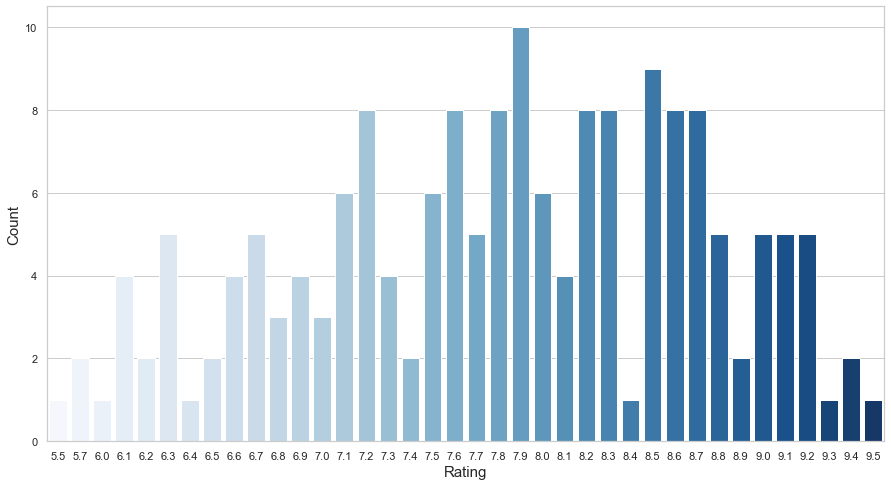

In [90]:
#New York City Venues Ratings Count

plt.figure(figsize=(15,8))
sns.set(style="whitegrid", color_codes=True)
# Make Seaborn countplot
axgif = sns.countplot(x="Rating", data=newyork_detailedvenues, palette="Blues")

axgif.set_xlabel("Rating",fontsize=15)
axgif.set_ylabel("Count",fontsize=15)

plt.show() 


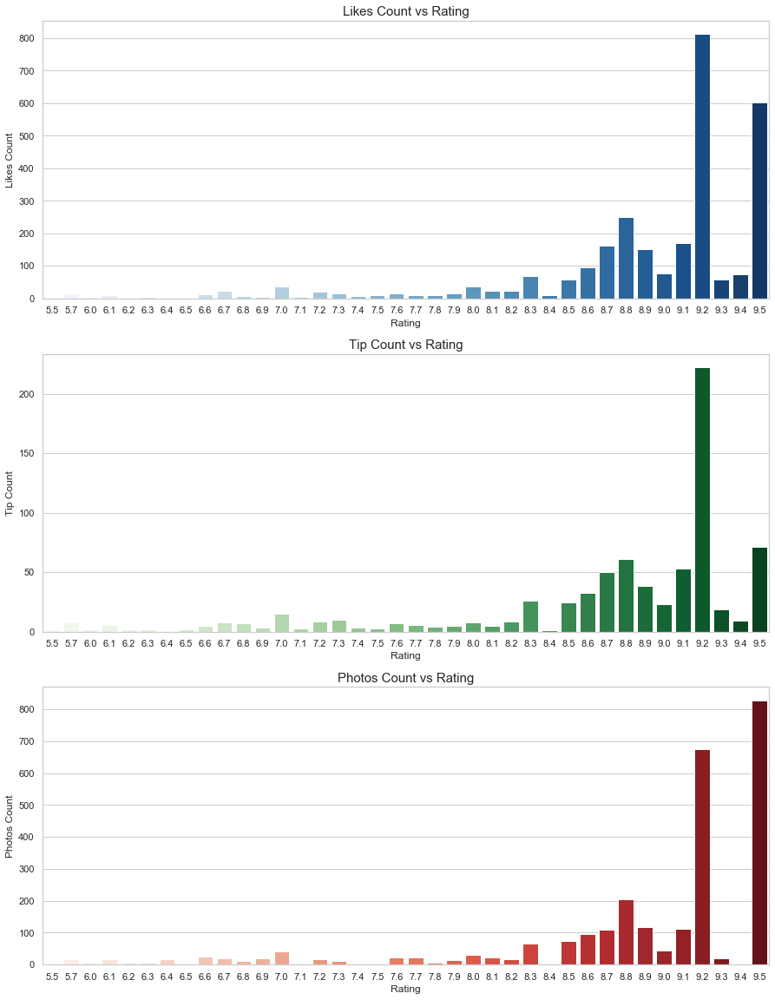

In [91]:
#Graphics between Rating vs Likes,Tips,Photo Counts - Venues of New York City
graphs = newyork_detailedvenues.groupby(by= 'Rating').mean().reset_index()
graphs = graphs.loc[:,['Rating','Tip Count','Likes Count','Photos Count']]

fig, axs = plt.subplots(nrows = 3, ncols = 1, figsize = (15,20))

sns.set(style="whitegrid", color_codes=True)

# Make Seaborn countplot

sns.barplot(x="Rating",y= "Likes Count" ,data=graphs, palette="Blues",ax=axs[0]).set_title('Likes Count vs Rating',fontsize=15)

sns.barplot(x="Rating",y= "Tip Count" ,data=graphs, palette="Greens",ax=axs[1]).set_title('Tip Count vs Rating',fontsize=15)

sns.barplot(x="Rating",y= "Photos Count" ,data=graphs, palette="Reds",ax=axs[2]).set_title('Photos Count vs Rating',fontsize=15)

plt.show()

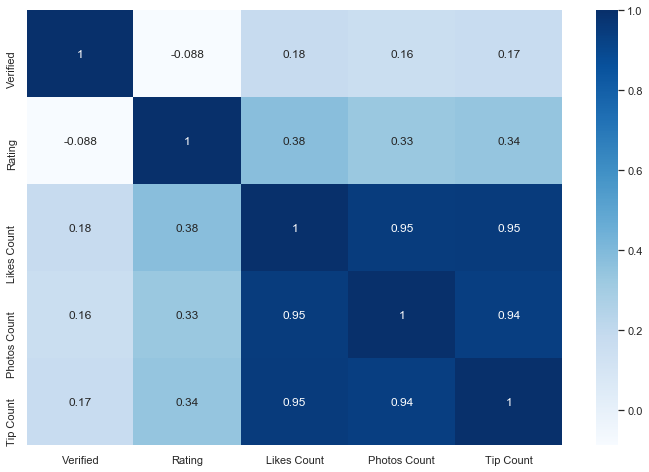

In [92]:
#Pearson Correlation 
#Using Pearson Correlation
newyork_detailedvenuescorr= newyork_detailedvenues.loc[:,('Verified','Rating','Likes Count','Photos Count', 'Tip Count')]
plt.figure(figsize=(12,8))
cor = newyork_detailedvenuescorr.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Blues)
plt.show()

Finally, when checking the charts of the city of New York, in the counting charts and in the Pearson correlation, we can notice that there is a low correlation of Rating with the other characteristics as opposed to how we initially thought. Instead, we can see that there is a very high proportional relationship between the tip count, the photos, and the like count.

## Results and Discussion <a id="results"></a>

In this part we are going to make the comparative tables between the two cities with the results obtained in the different analyzes carried out in the previous section. And from these data we are going to discuss the results of each city and establish the similarities and differences that exist in each analysis.

#### Results comparasion - Venues Density

In [93]:
#We build the comparative table
df_area = pd.DataFrame(data={'Borough':[to_bor,ny_bor],'Neighborhood':[to_neigh,ny_neigh]}, index = ['Toronto (Venues/Km²)','New York (Venues/Km²)'])
df_area_transposed = df_area.T
df_area_transposed.round(2)

,Toronto (Venues/Km²),New York (Venues/Km²)
Borough,2.61,26.93
Neighborhood,2.65,23.60


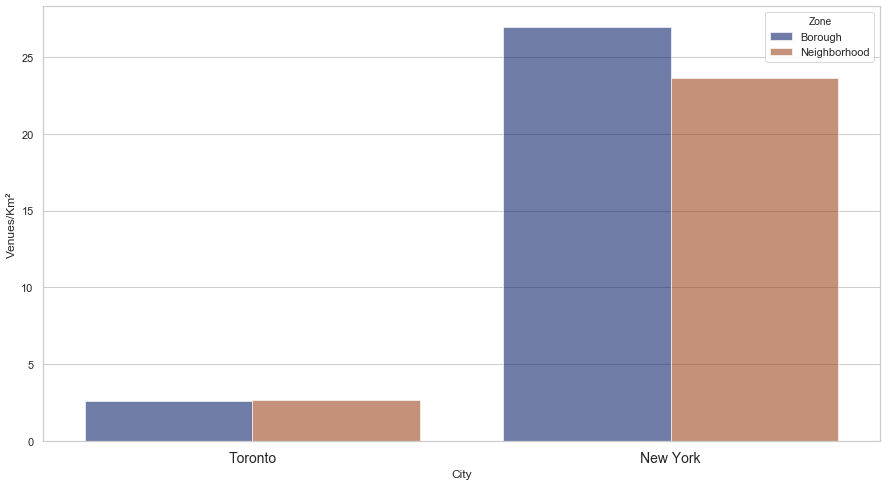

In [142]:
#Then we procced the graph the cimpartive table
df_area_graph = pd.DataFrame(data={'Zone':['Borough','Neighborhood','Borough','Neighborhood'], 'City':['Toronto','Toronto','New York','New York'], 'Venues/Km²':[to_bor,to_neigh,ny_bor,ny_neigh]})
bar,ax = plt.subplots(figsize=(15,8))
total = float(len(df_area_graph))
plt.setp(ax.get_xticklabels(), rotation=0, fontsize = 14)
ax = sns.barplot(x="City", y="Venues/Km²", hue="Zone", data=df_area_graph, ci="sd", palette="dark", alpha=.6)


<p style='text-align: justify;'>In our first analysis, we calculated the quantities of the average density of venues found through the Foursquare API with the explore endpoint, making use of the search parameters such as the radius and the geospatial coordinates of each neighborhood to calculate the search area and with this Finally, we obtained the Venues / Km² results for each Neighborhood / Borough of the city of Toronto and New York. We can see a clear difference between the results of New York, which yielded an amount 10 times greater than that presented by Toronto, with an average value greater than 23 Venues / Km² for all the neighborhood / borough of NYC, with what means that in a square kilometer we will find approximately 23 venues. Regarding the city of Toronto, we obtained an average value of 2.6 Venues / Km² for the neighborhoods and boroughs of NYC. It should be noted that this difference could be noted in the dimensions of the dataframes of the venues of each city, since the dimensions of NY had produced more amounts of venues, therefore a greater number of rows.

#### Results Comparasion - Main Categories


In [111]:
#We build the comparative table
maincat_results = ny_maincat_df.drop('Venue',axis = 1).join(to_maincat_df.drop('Venue',axis = 1), lsuffix=' - New York', rsuffix='- Toronto')
maincat_results = maincat_results.fillna(0)

column_names = ['Venue (%)- Toronto', 'Venue (%) - New York']

maincat_results = maincat_results.reindex(columns=column_names)
maincat_results


,Venue (%)- Toronto,Venue (%) - New York
Main Category,,
Food,57.1,53.14
Shop & Service,23.8,22.57
Outdoors & Recreation,9.7,10.45
Nightlife Spot,3.5,5.25
Travel & Transport,2.2,4.61
Arts & Entertainment,3.3,3.01
Professional & Other Places,0.4,0.79
College & University,0.1,0.11
Residence,0.0,0.06


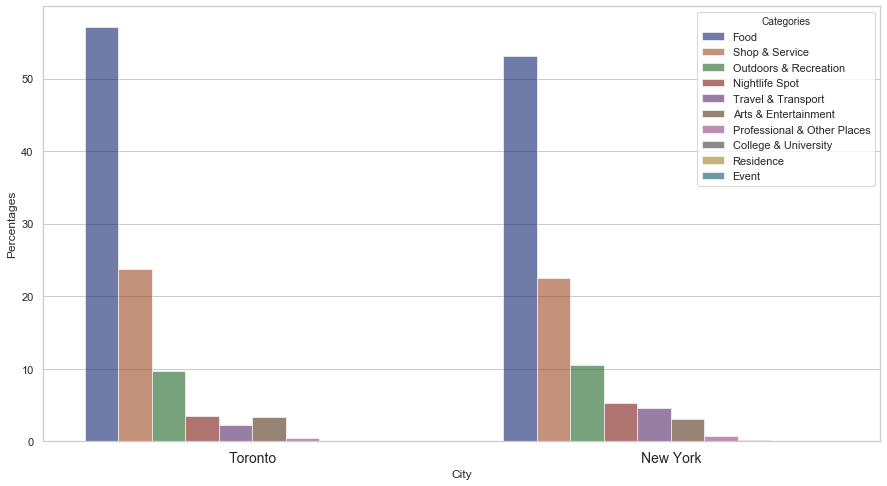

In [141]:
tomacat = []
nymacat = []
maincatlist = maincat_results.index.tolist()
for i in range(0,10):
    
    tomacat.append(maincat_results['Venue (%)- Toronto'][i])
    nymacat.append(maincat_results['Venue (%) - New York'][i])

df_maincat_graph = pd.DataFrame(data={'Categories':maincatlist*2, 'City':['Toronto']*10 + ['New York']*10, 'Percentages':tomacat+nymacat})
df_maincat_graph.head()

bar,ax = plt.subplots(figsize=(15,8))
total = float(len(df_maincat_graph))
plt.setp(ax.get_xticklabels(), rotation=0, fontsize = 14)
ax = sns.barplot(x="City", y="Percentages", hue="Categories", data=df_maincat_graph, ci="sd", palette="dark", alpha=.6)


<p style='text-align: justify;'>Regarding our second analysis, we decided to make a comparison of the main categories of all the places found in the exploration with the coordinates of each neighborhood in both cities. From this, a grouping by main categories of the venues was made, with which we obtained their proportions. In the table we can see the following: both cities have the same order of categories based on the proportion and also a close similarity in terms of the percentages in the same categories. In the city of New York we can notice that there is a greater amount of variety of categories, since we have a positive value for the 10 categories that are in the table. On the other hand, in the city of Toronto, it only has stores within the first 8 categories shown in the table.

#### Results comparasion - Rating, Likes, Tips, Photos count analysis

In [98]:
df_detailedinfo = pd.DataFrame(data={'Toronto City':[ratingto,tipcountto,likescountto,photoscountto],'New York City':[ratingny,tipcountny,likescountny,photoscountny]}, index = ['Rating','Tip Count','Likes Count','Photos Count'])
df_detailedinfo.round(2)

,Toronto City,New York City
Rating,7.60,7.80
Tip Count,22.23,21.52
Likes Count,75.68,72.80
Photos Count,120.06,63.11


<p style='text-align: justify;'>In this last analysis, we made use of the detailed information of places that we selected from each city, where we selected a number of places that are closer to the center of each borough so as not to exceed the limits of calls that the Foursquare API presents a selection of premises. Finally, analyzing the new features of each location such as Rating, Tips, Likes, and photo counts, we obtained the following average values per location. In Raitng, we can see that New York has a higher average by a few tenths of a difference. As for Tip Count and Likes Count, we have similar amounts. And finally, in Photos Count, Toronto has twice the average number of photos in its premises.

## Conclusion <a id="conclusion"></a>

Finally, the purpose of this project was to find similarities and differences between these two large cities based on their locations, New York City and Toronto City, in order for this information to be of help to stakeholders who have projected an expansion of your brand in North America. It is worth mentioning that the results are not entirely accurate (Referential), mainly due to the limits in calls that Foursquare presents in the Personal Account Tier. Taking into account the above, we can conclude the following:

* New York City is the most populous city in venues than Toronto. New York has a higher density of venues per square kilometer, 23 Venues / Km², while the city of Toronto has a venues density value of 2.6 Venues / Km². In New York City you will find 10 times more venues than in Toronto.


* The city of New York presents a greater diversity of categories among its locations compared to the city of Toronto. And both cities present similar proportions of the largest categories and we could verify this with the grouping by clusters.

* The city of New York has a slightly higher average rating value for locations, while the city of Toronto has an average rating of approximately twice that of NY for Photos per location.